# Estudo de Linguagem Natural nos Planos de Governo - Eleições 2018

Neste trabalho, pretendo computar algumas estatísticas dos planos de governo dos candidatos a presidência de 2018.
Pretendo apenas gerar gráficos e também disponibilizar as tabelas com os dados.

Usando alguns resultados desta análise, publiquei um [artigo no Medium](https://medium.com/@luizamaral306/deus-ou-quinta-s%C3%A9rie-fa0e4e81694d).

O dataset também está disponível no [Kaggle](https://www.kaggle.com/luxedo/planos-de-governo-eleies-presidenciais-2018).

Começamos importantdo as bibliotecas necessárias e ajustando o ambiente:

In [24]:
from collections import OrderedDict
import os
import string


import cycler
import gensim
from IPython.display import display, HTML
import matplotlib as mpl
import matplotlib.pyplot as plt
import nltk
import numpy as np
import pandas as pd
import pyLDAvis.gensim
import PyPDF2
from sklearn import feature_extraction, decomposition
import textract
import unidecode
import warnings
import wordcloud


%matplotlib inline
nltk.download("stopwords", "punkt")
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
color = plt.cm.tab20b(np.linspace(0, 1, 15))
mpl.rcParams['axes.prop_cycle'] = cycler.cycler('color', color)
warnings.filterwarnings('ignore')
STOPWORDS = unidecode.unidecode(" ".join(nltk.corpus.stopwords.words("portuguese"))).split()

[nltk_data] Downloading package stopwords to punkt...
[nltk_data]   Package stopwords is already up-to-date!


## 2. Quantidade de páginas, palavras e períodos.

In [2]:
PASTA_PROGRAMAS = "planos/"
df = pd.DataFrame(os.listdir(PASTA_PROGRAMAS), columns=["arquivo"])
df["candidato"] = df["arquivo"].str.replace(".pdf", "").str.split("_").str.join(" ").str.strip()
df["arquivo"] = PASTA_PROGRAMAS+df["arquivo"]
df = df.set_index("candidato").sort_index()

In [3]:
df["paginas"] = df["arquivo"].apply(lambda linha: PyPDF2.PdfFileReader(linha).getNumPages())
df.loc["Marina Silva", "paginas"] *=2 # Layout de livreto

In [4]:
df["texto"] = df["arquivo"].apply(lambda arquivo: textract.process(arquivo).decode("utf-8"))

df.loc["Ciro Gomes", ["texto"]] = df.loc["Ciro Gomes", ["texto"]]\
    .str.replace("\nn \x07", "\n")\
    .str.replace("\n\x07 |\x0cn|\x07|(\\nn)+|\tn", "")  # WTF Ciro?!?

df["texto"] = df["texto"].str.strip().str.replace("\n+", "\n").str.lower().apply(unidecode.unidecode)
df["caracteres"] = df["texto"].apply(len)

In [5]:
def estatisticas_periodo(row):
    lista_de_períodos = nltk.tokenize.sent_tokenize(row["texto"])
    palavras = pd.Series(lista_de_períodos)\
        .str.replace(f"[{string.punctuation}]", "")\
        .apply(nltk.word_tokenize).apply(len)
    pontuacao = pd.Series(lista_de_períodos)\
        .str.replace(f"[^{string.punctuation}]", "")\
        .apply(nltk.word_tokenize).apply(len)
    return pd.Series({
        "lista_de_periodos": lista_de_períodos,
        "periodos": len(palavras),
        "periodos_por_pagina": len(palavras)/row["paginas"],
        "palavras_por_periodo": palavras.mean(),
        "palavras_por_periodo_std": palavras.std(),
        "palavras_por_periodo_max": palavras.max(),
        "pontuacao_por_periodo": pontuacao.mean(),
        "pontuacao_por_periodo_std": pontuacao.std(),
        "pontuacao_por_periodo_max": pontuacao.max()
    })

df = pd.concat([df, df[["texto", "paginas"]].apply(estatisticas_periodo, axis=1)], axis=1)

In [6]:
def estatísticas_palavras(row):
    lista_de_palavras = row[["texto"]].str.replace("\n", " ")\
        .str.replace(f"[{string.punctuation}]", "")\
        .apply(nltk.word_tokenize)
    pontuacao = row[["texto"]].str.replace("\n", " ")\
        .str.replace(f"[^{string.punctuation}]", "")\
        .apply(nltk.word_tokenize).apply(len).values[0]
    palavras = pd.Series(lista_de_palavras.values[0]).apply(len)
    return pd.Series({
        "lista_de_palavras": lista_de_palavras["texto"],
        "palavras": len(palavras),
        "palavras_unicas": len(set(lista_de_palavras.values[0])),
        "palavras_por_pagina": len(palavras)/row["paginas"],
        "pontuacao": pontuacao,
        "pontuacao_por_pagina": pontuacao/row["paginas"],
        "palavras_por_pontuacao": len(palavras)/pontuacao,
        "tamanho_das_palavras": palavras.mean(),
        "tamanho_das_palavras_std": palavras.std(),
    })

df = pd.concat([df, df[["texto", "paginas"]].apply(estatísticas_palavras, axis=1)], axis=1)

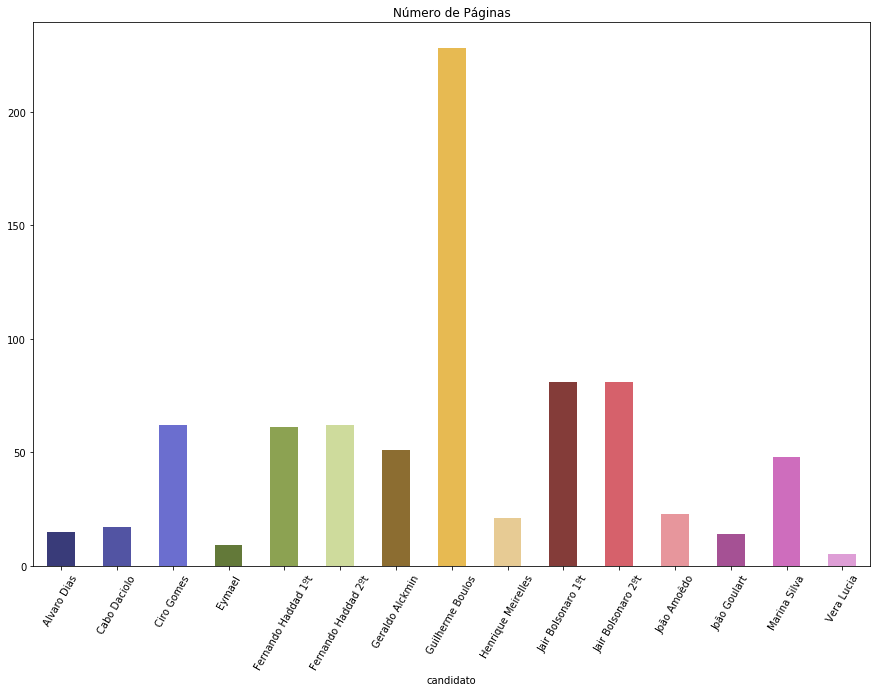

In [7]:
df["paginas"].plot.bar(figsize=(15, 10), rot=60, title="Número de Páginas")

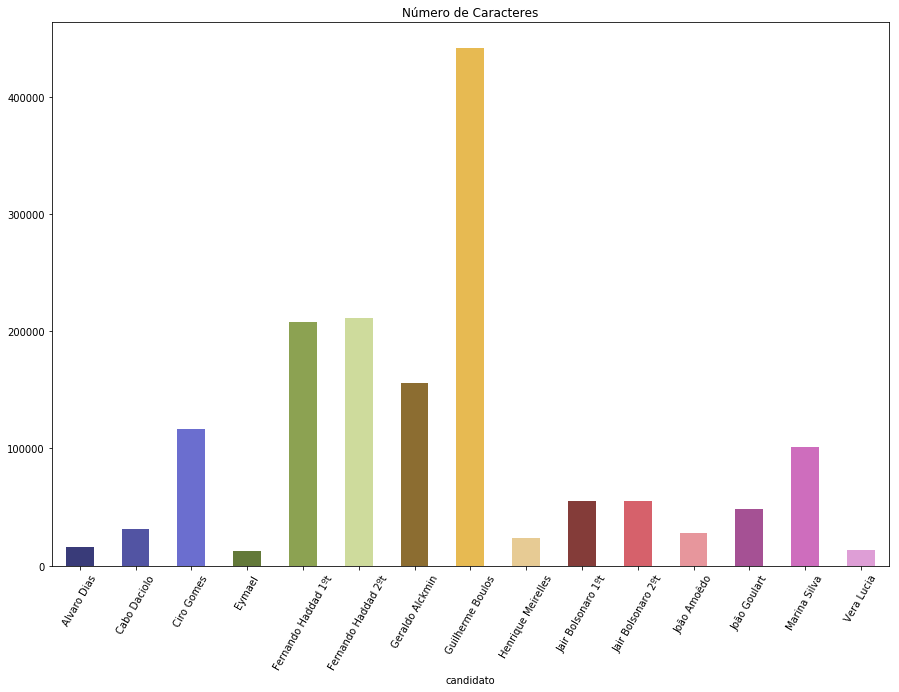

In [8]:
df["caracteres"].plot.bar(figsize=(15, 10), rot=60, title="Número de Caracteres")

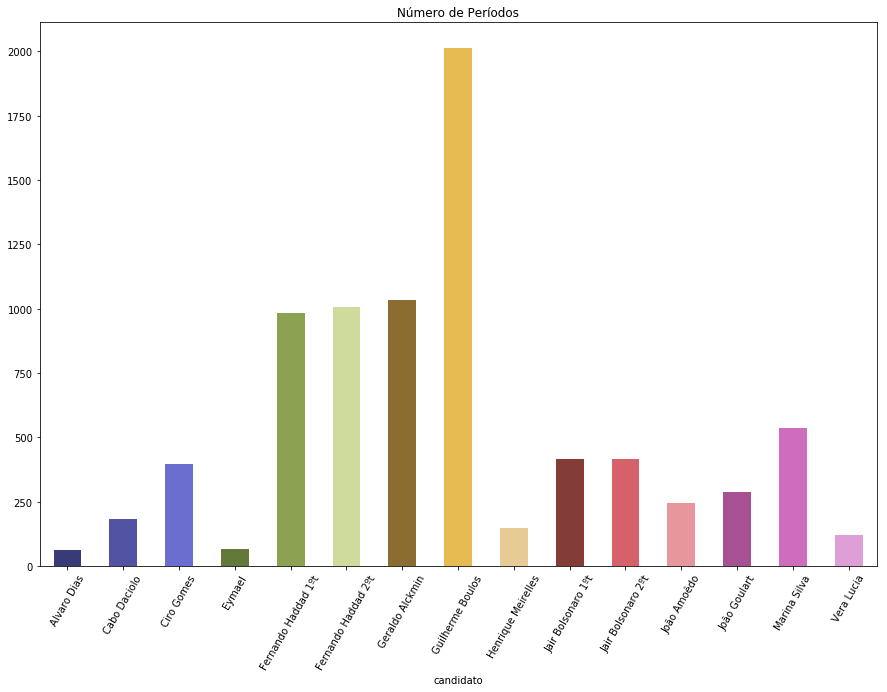

In [9]:
df["periodos"].plot.bar(figsize=(15, 10), rot=60, title="Número de Períodos")

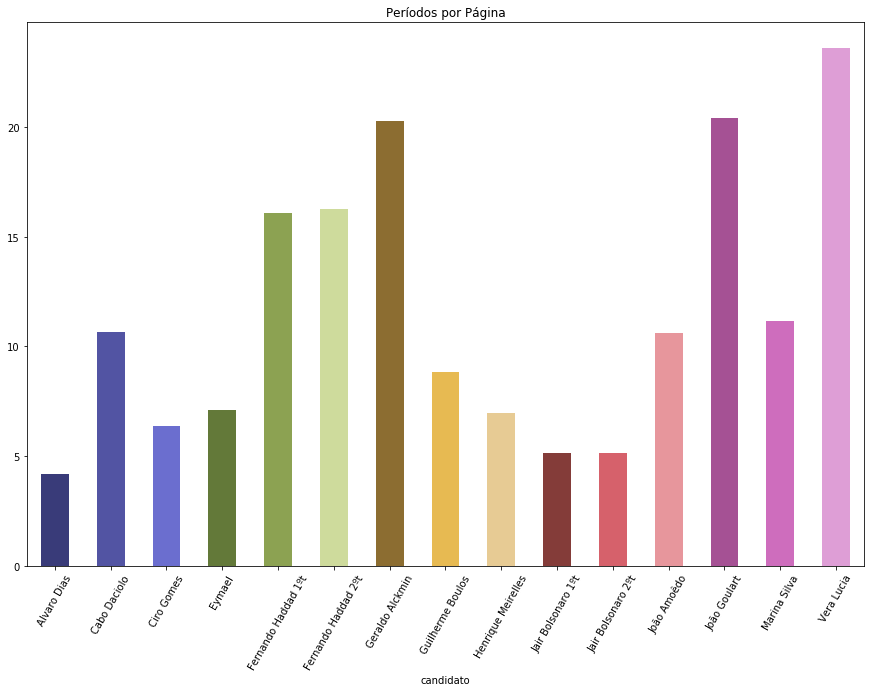

In [10]:
df["periodos_por_pagina"].plot.bar(figsize=(15, 10), rot=60, title="Períodos por Página")

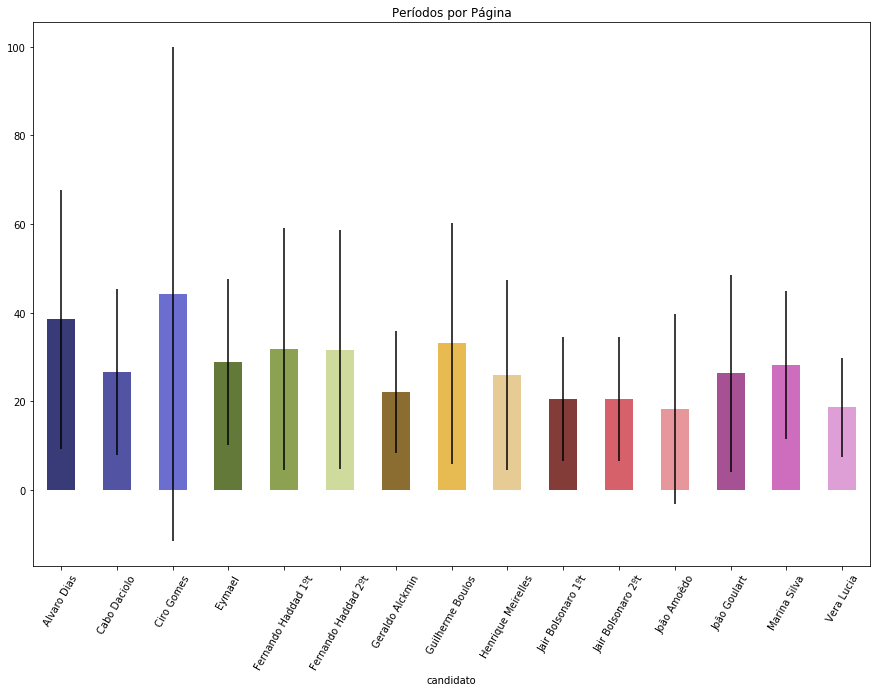

In [11]:
df["palavras_por_periodo"].plot.bar(figsize=(15, 10), rot=60, title="Períodos por Página", yerr=df["palavras_por_periodo_std"])

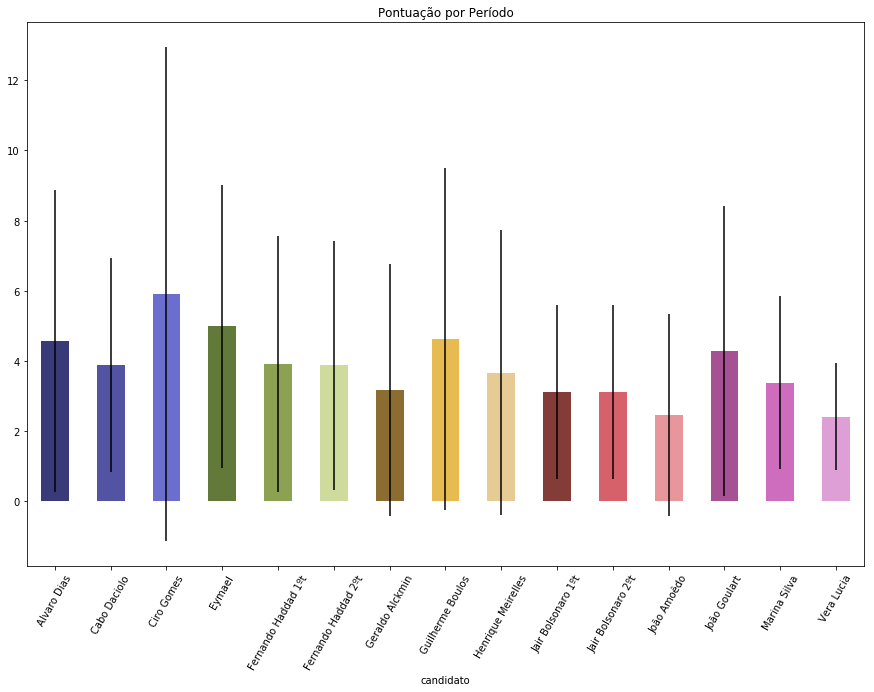

In [12]:
df["pontuacao_por_periodo"].plot.bar(figsize=(15, 10), rot=60, title="Pontuação por Período", yerr=df["pontuacao_por_periodo_std"])

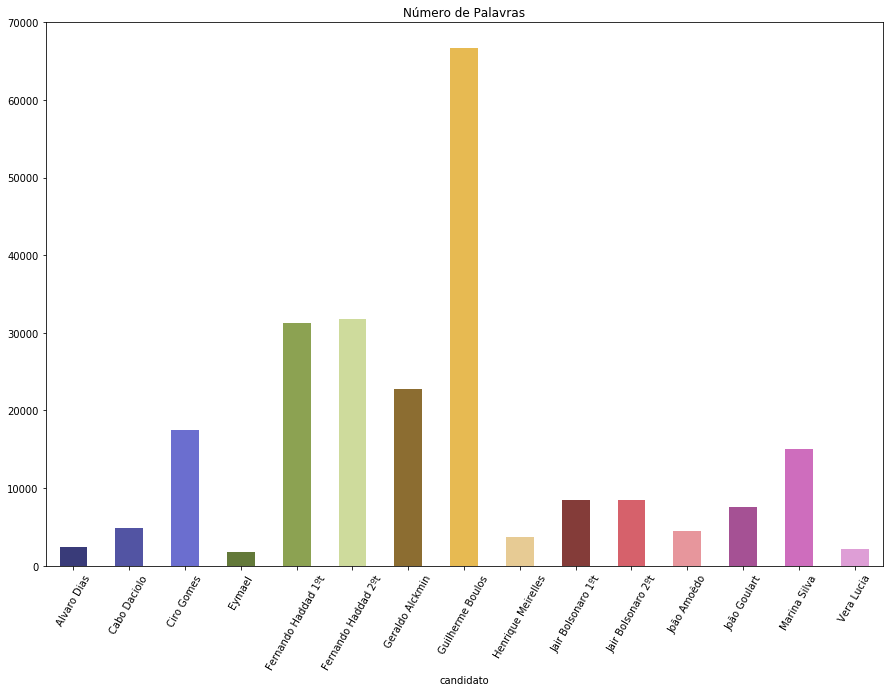

In [13]:
df["palavras"].transpose().plot.bar(figsize=(15, 10), rot=60, title="Número de Palavras")

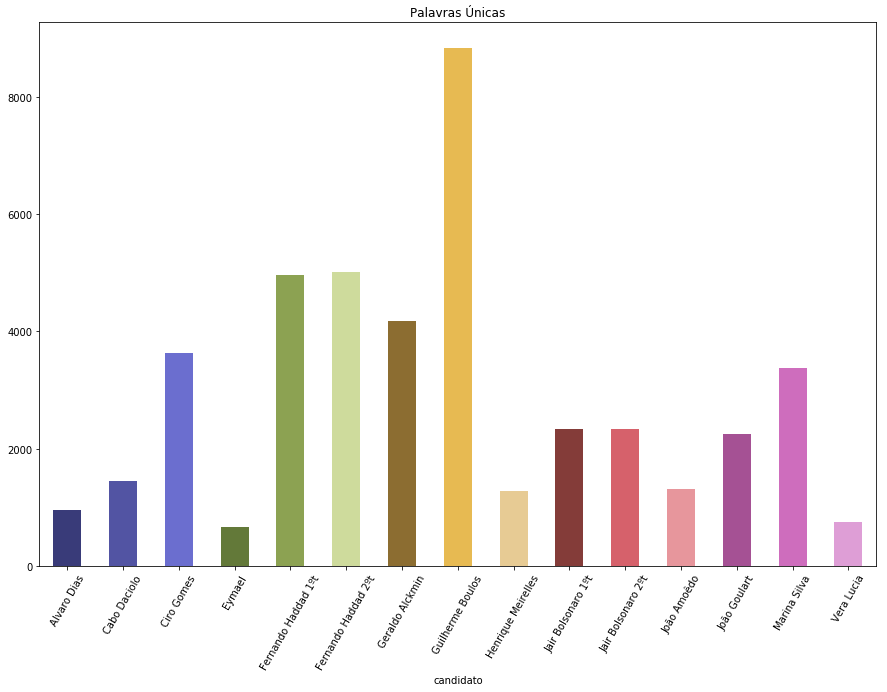

In [14]:
df["palavras_unicas"].transpose().plot.bar(figsize=(15, 10), rot=60, title="Palavras Únicas")

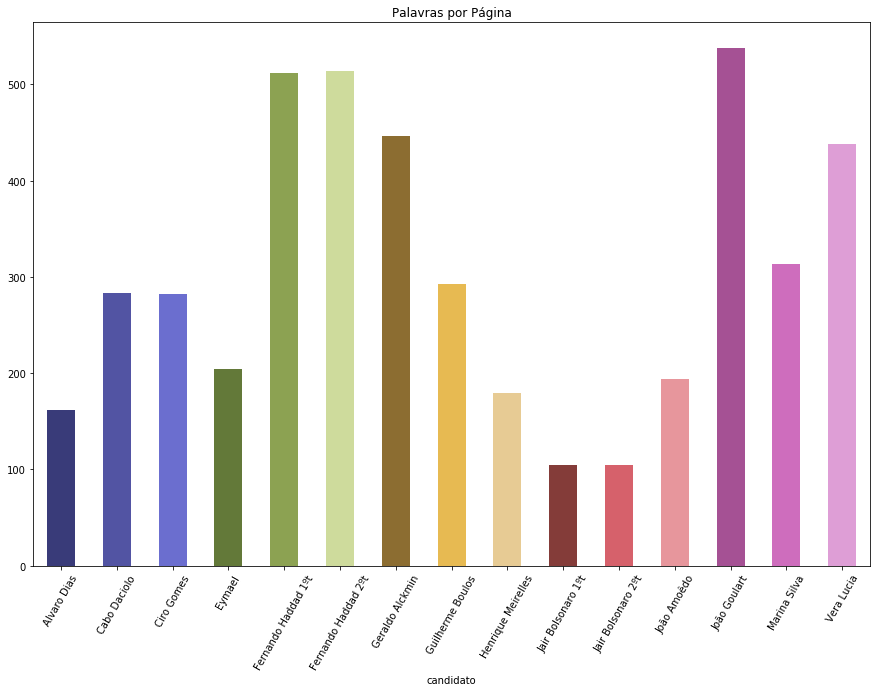

In [15]:
df["palavras_por_pagina"].plot.bar(figsize=(15, 10), rot=60, title="Palavras por Página")

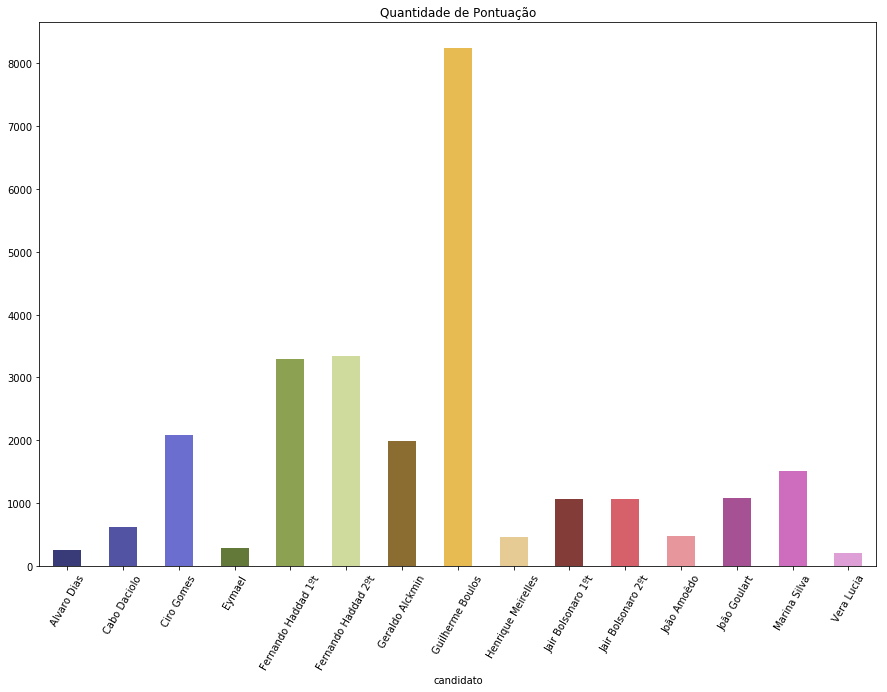

In [16]:
df["pontuacao"].plot.bar(figsize=(15, 10), rot=60, title="Quantidade de Pontuação")

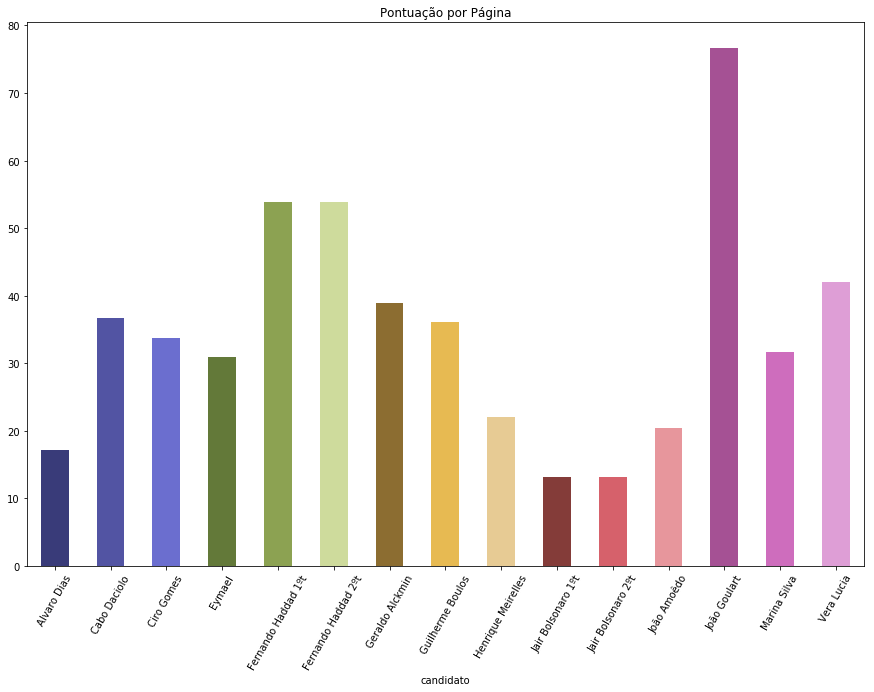

In [17]:
df["pontuacao_por_pagina"].plot.bar(figsize=(15, 10), rot=60, title="Pontuação por Página")

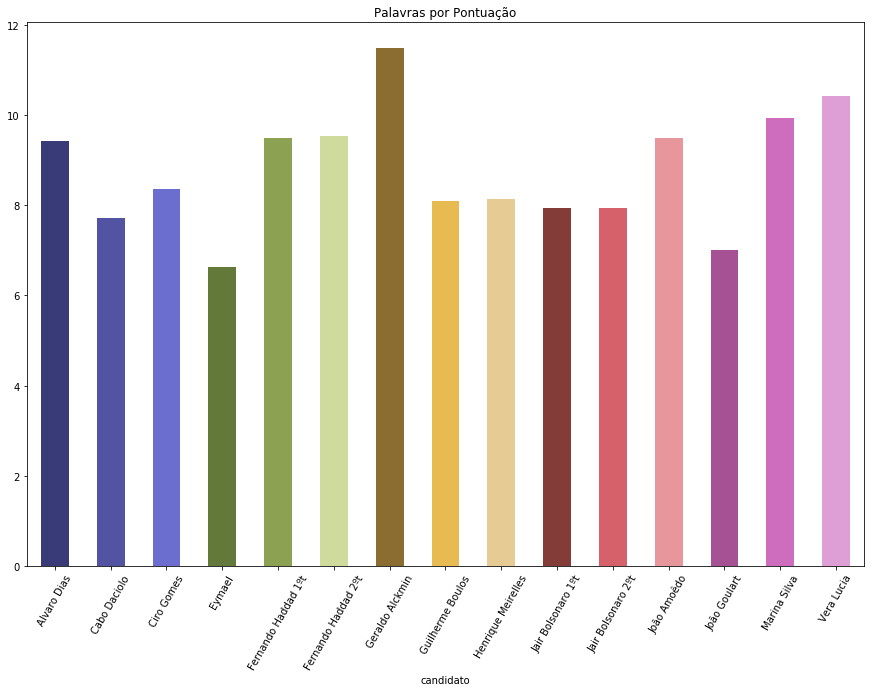

In [18]:
df["palavras_por_pontuacao"].plot.bar(figsize=(15, 10), rot=60, title="Palavras por Pontuação")

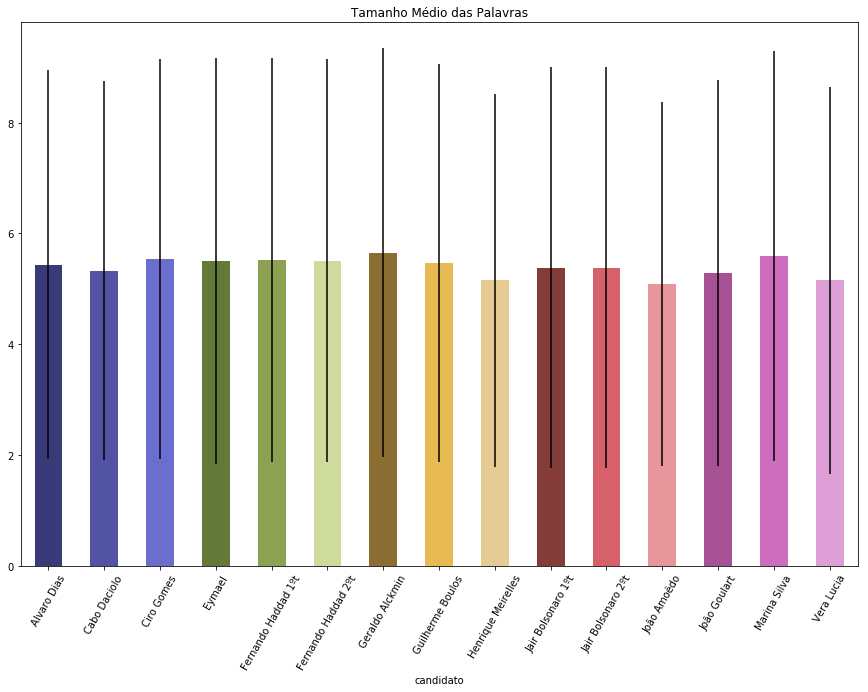

In [19]:
df["tamanho_das_palavras"].plot.bar(figsize=(15, 10), rot=60, title="Tamanho Médio das Palavras", yerr=df["tamanho_das_palavras_std"])

In [20]:
df.drop(columns=["arquivo", "texto", "lista_de_periodos", "lista_de_palavras"])

,paginas,caracteres,periodos,periodos_por_pagina,palavras_por_periodo,palavras_por_periodo_std,palavras_por_periodo_max,pontuacao_por_periodo,pontuacao_por_periodo_std,pontuacao_por_periodo_max,palavras,palavras_unicas,palavras_por_pagina,pontuacao,pontuacao_por_pagina,palavras_por_pontuacao,tamanho_das_palavras,tamanho_das_palavras_std
candidato,,,,,,,,,,,,,,,,,,
Alvaro Dias,15,15944,63,4.200000,38.444444,29.220396,108,4.555556,4.302204,16,2422,949,161.466667,257,17.133333,9.424125,5.436829,3.503219
Cabo Daciolo,17,31187,181,10.647059,26.574586,18.663429,110,3.878453,3.056256,19,4810,1450,282.941176,623,36.647059,7.720706,5.323701,3.420092
Ciro Gomes,62,116959,396,6.387097,44.186869,55.782584,665,5.904040,7.048899,64,17498,3634,282.225806,2090,33.709677,8.372249,5.532689,3.606715
Eymael,9,12311,64,7.111111,28.781250,18.761214,110,4.984375,4.041421,29,1842,662,204.666667,278,30.888889,6.625899,5.496743,3.661720
Fernando Haddad 1ºt,61,207780,982,16.098361,31.792261,27.235104,692,3.902240,3.648777,62,31220,4956,511.803279,3288,53.901639,9.495134,5.520788,3.638408
Fernando Haddad 2ºt,62,211424,1008,16.258065,31.569444,26.966107,692,3.866071,3.553383,58,31822,5009,513.258065,3337,53.822581,9.536110,5.509239,3.628600
Geraldo Alckmin,51,155818,1034,20.274510,22.026112,13.802868,245,3.167311,3.591705,102,22775,4181,446.568627,1982,38.862745,11.490918,5.653875,3.689354
Guilherme Boulos,228,441318,2013,8.828947,33.116244,27.210785,544,4.621957,4.867290,95,66663,8832,292.381579,8241,36.144737,8.089188,5.467081,3.593410
Henrique Meirelles,21,23796,146,6.952381,25.821918,21.416940,186,3.664384,4.073933,28,3770,1279,179.523810,463,22.047619,8.142549,5.154111,3.365640


In [21]:
def calcular_palavras_unicas(row):
    bag = set()
    data = []
    for palavra in row:
        bag.add(palavra)
        data.append(len(bag))
    return data
    
df_palavras_unicas = df["lista_de_palavras"].apply(calcular_palavras_unicas).apply(pd.Series).transpose()

Text(0.5,1,'Palavras únicas ao longo do texto\nPlanos de governo - Eleições 2018')

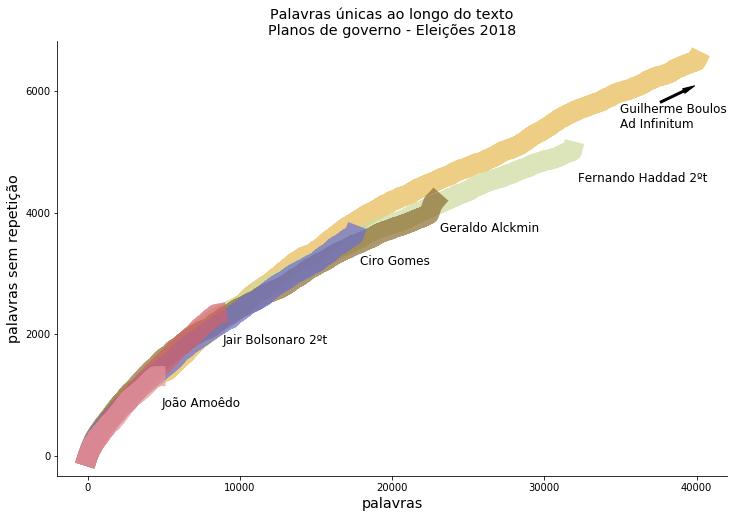

In [25]:
select_candidatos = OrderedDict((
    ("Guilherme Boulos", {"c": color[7], "offset": (400, -500)}),
    ("Fernando Haddad 2ºt", {"c": color[5], "offset": (400, -500)}),
    ("Geraldo Alckmin", {"c": color[6], "offset": (400, -500)}),
    ("Ciro Gomes", {"c": color[2], "offset": (400, -500)}),
    ("Jair Bolsonaro 2ºt", {"c": color[10], "offset": (400, -500)}),
    ("João Amoêdo", {"c": color[11], "offset": (400, -500)}),
))
fontsize = "x-large"

fig, ax = plt.subplots(figsize=(12, 8))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xticks(np.arange(0, 40000+1, 10000))
ax.set_yticks(np.arange(0, 6000+1, 2000))
ax.set_xlabel("palavras", fontsize=fontsize)
ax.set_ylabel("palavras sem repetição", fontsize=fontsize)
with pd.plotting.plot_params.use('x_compat', True):
    for candidato, item in select_candidatos.items():
        sr_tmp = df_palavras_unicas[candidato]
        sr_tmp[:40000].plot(c=item["c"], linewidth=20, alpha=0.7, ax=ax)
        y = sr_tmp.max().astype(int)
        x = sr_tmp[sr_tmp == sr_tmp.max()].index[-1]
        candidato_offset = np.array((x, y))+item["offset"]
        if candidato != "Guilherme Boulos":
            ax.annotate(candidato, candidato_offset, fontsize="large")
        else:
            ax.annotate("", (40000, 6100), (37500, 5800), arrowprops=dict(facecolor='black', shrink=0.05, width=2, headwidth=5))
            ax.annotate("Guilherme Boulos\nAd Infinitum", (35000, 5400), fontsize="large")
ax.set_title("Palavras únicas ao longo do texto\nPlanos de governo - Eleições 2018", fontsize=fontsize)

## 3. Estudo da pontuação

In [26]:
df["quebras_de_linha"] = df["texto"].str.count("[\n]")
pontuação = {
    "ponto_final": "[.]",
    "vírgula": "[,]",
    "parenteses": "[()]",
    "ponto_virgula": "[;]",
    "dois_pontos": "[:]",
    "asterisco": "[*]",
    "hifen/menos": "[-]",
    "porcentagem": "[%]",
    "barra": "[\\/]",
    "aspas": "[\"\']",
    "moeda": "[$]",
    "mais": "[+]",
    "exclamação": "[!]",
    "interrogação": "[?]",
    "subtraço": "[_]",
    "colchetes": "[\[\]]",
    "chaves": "[\{\}]",
    "e_comercial": "[&]",
    "cerquilha": "#"
}
for key, value in pontuação.items():
    df[key] = df["texto"].str.count(value)

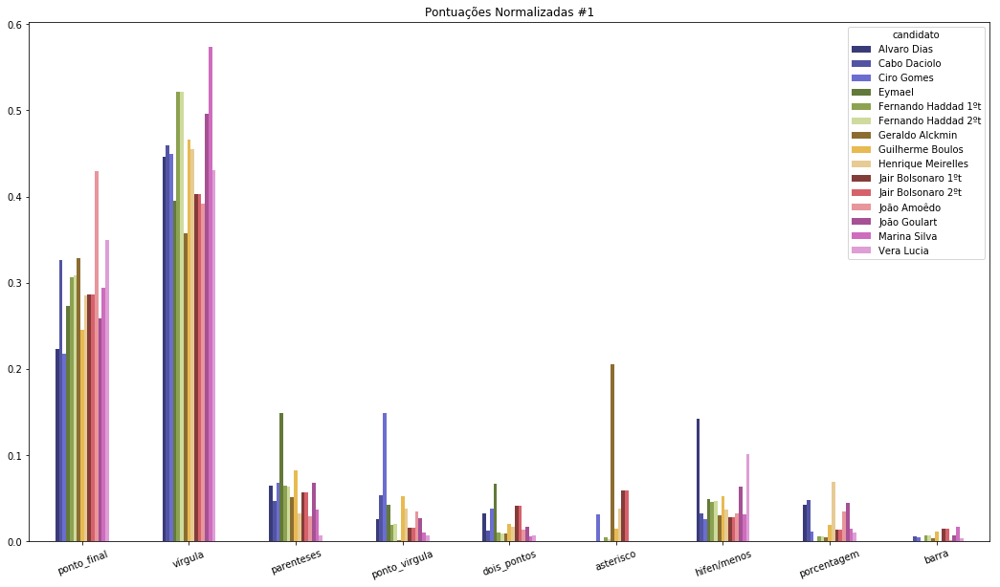

In [27]:
df[list(pontuação)]\
    .divide(df[list(pontuação)].sum(axis=1), axis=0)\
    [list(pontuação)[:len(pontuação)//2]]\
    .transpose().plot.bar(figsize=(18, 10), title="Pontuações Normalizadas #1", rot=20)

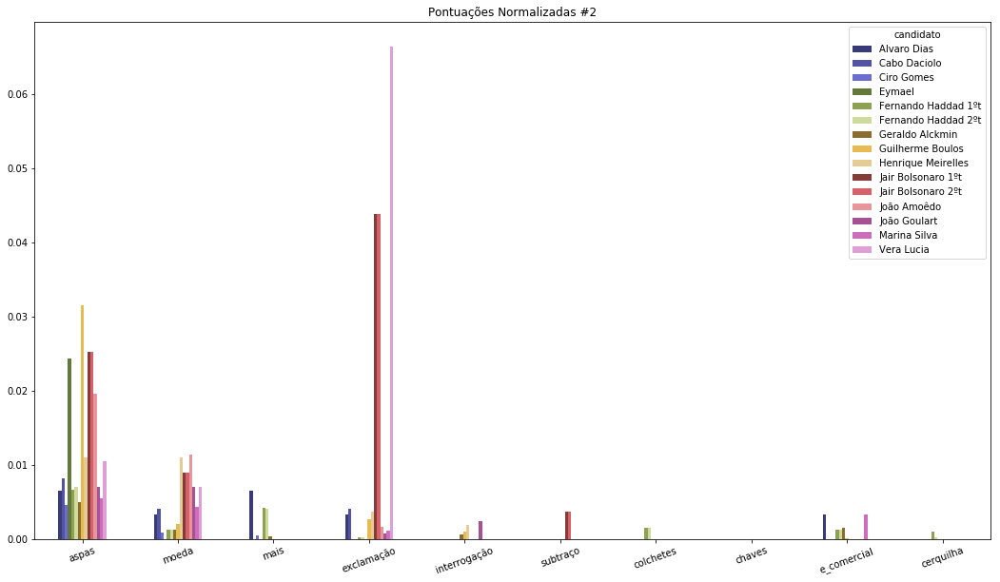

In [28]:
df[list(pontuação)]\
    .divide(df[list(pontuação)].sum(axis=1), axis=0)\
    [list(pontuação)[len(pontuação)//2:]]\
    .transpose().plot.bar(figsize=(18, 10), title="Pontuações Normalizadas #2", rot=20)

Text(0.5,1,'Quantidade de exclamações relativas ao total de pontuações\nPlanos de governo - Eleições 2018')

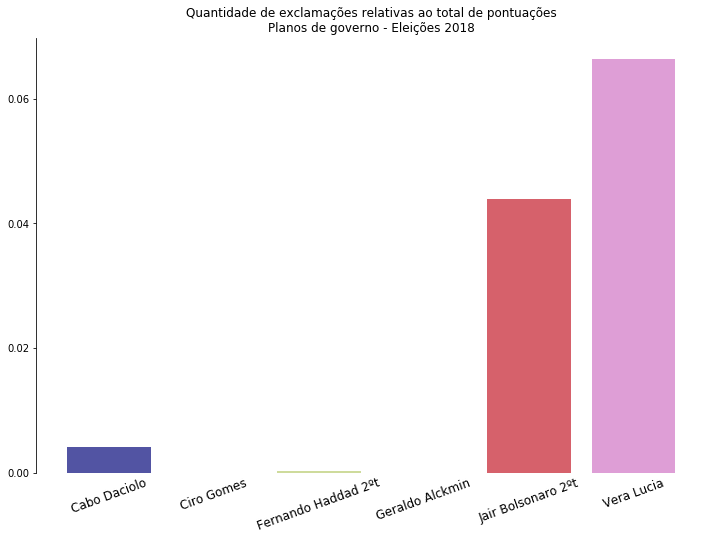

In [31]:
select_candidatos = OrderedDict((
    ("Cabo Daciolo", {"c": color[1], "offset": (400, -500)}),
    ("Ciro Gomes", {"c": color[2], "offset": (400, -500)}),
    ("Fernando Haddad 2ºt", {"c": color[5], "offset": (400, -500)}),
    ("Geraldo Alckmin", {"c": color[6], "offset": (400, -500)}),
    ("Jair Bolsonaro 2ºt", {"c": color[10], "offset": (400, -500)}),
    ("Vera Lucia", {"c": color[14], "offset": (400, -500)}),
))
fontsize = "large"


fig, ax = plt.subplots(figsize=(12, 8))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xticks(np.arange(0, len(select_candidatos)+1, 1))
ax.set_xticklabels(list(select_candidatos.keys()), rotation=20, fontsize=fontsize)
ax.set_yticks(np.arange(0, 0.061, 0.02))
ax.tick_params(axis='x', which='both',length=0)


with pd.plotting.plot_params.use('x_compat', True):
    for idx, (candidato, item) in enumerate(select_candidatos.items()):
        sr_tmp = df.loc[candidato]
        ax.bar(idx, sr_tmp["exclamação"]/sr_tmp[list(pontuação)].sum(),color=item["c"])
ax.set_title("Quantidade de exclamações relativas ao total de pontuações\nPlanos de governo - Eleições 2018", fontsize=fontsize)

In [32]:
df[["quebras_de_linha"]+list(pontuação.keys())]

,quebras_de_linha,ponto_final,vírgula,parenteses,ponto_virgula,dois_pontos,asterisco,hifen/menos,porcentagem,barra,aspas,moeda,mais,exclamação,interrogação,subtraço,colchetes,chaves,e_comercial,cerquilha
candidato,,,,,,,,,,,,,,,,,,,,
Alvaro Dias,326,69,138,20,8,10,0,44,13,0,2,1,2,1,0,0,0,0,1,0
Cabo Daciolo,526,239,336,34,39,9,0,24,35,4,6,3,0,3,0,0,0,0,0,0
Ciro Gomes,1727,521,1078,164,356,90,74,63,26,10,11,2,1,0,0,0,0,0,0,0
Eymael,227,90,130,49,14,22,0,16,0,0,8,0,0,0,0,0,0,0,0,0
Fernando Haddad 1ºt,2492,1248,2120,261,79,40,19,185,23,27,27,5,17,1,0,0,6,0,5,4
Fernando Haddad 2ºt,2583,1276,2159,262,85,39,9,192,23,27,29,5,17,1,0,0,6,0,5,1
Geraldo Alckmin,2979,1113,1211,174,5,31,694,101,16,13,17,4,1,0,2,0,0,0,5,0
Guilherme Boulos,6735,2367,4482,788,504,194,139,500,185,108,303,19,0,25,10,0,0,0,1,0
Henrique Meirelles,384,156,249,18,21,9,21,20,38,0,6,6,0,2,1,0,0,0,0,0


## 4. Estudo das palavras relevantes

In [33]:
df["lista_de_palavras_stopwords"] = df["lista_de_palavras"].apply(lambda row: [palavra for palavra in row if palavra not in STOPWORDS])
df["palavras_frequentes"] = df["lista_de_palavras_stopwords"].apply(lambda row: [item for item in nltk.FreqDist(row).items() if item[1] >= 4])

In [34]:
df["wordcloud_palavras_frequentes"] = ""
display(HTML("<h3>Palavras mais frequentes</h3>"))
for key, value in df["palavras_frequentes"].iteritems():
    display(HTML(f"<h4>{key}</h4>"))
    df_candidato = pd.DataFrame(value, columns=["Palavra", "Quantidade"])
    df_candidato["%"] = df_candidato["Quantidade"]/df.loc[key, "palavras"]  # Normalizada pela quantidade de palavras do plano
        
    frequencias = df_candidato[["Palavra", "%"]].set_index("Palavra")["%"].to_dict()
    df.loc[key, "wordcloud_palavras_frequentes"] = wordcloud.WordCloud(
        width=800, height=400, background_color='white', random_state=50)\
        .generate_from_frequencies(frequencias).to_image()
    display(df_candidato.sort_values("Quantidade", ascending=False).head(20))

,Palavra,Quantidade,%
1,mudanca,20,0.008258
0,coligacao,19,0.007845
2,verdade,19,0.007845
35,governo,18,0.007432
6,metas,13,0.005367
39,crescimento,13,0.005367
58,ser,10,0.004129
55,populacao,10,0.004129
7,sociedade,9,0.003716
60,estado,9,0.003716


,Palavra,Quantidade,%
60,publica,37,0.007692
12,pais,31,0.006445
56,educacao,25,0.005198
61,saude,24,0.004990
5,brasil,21,0.004366
54,politicas,18,0.003742
28,federal,17,0.003534
41,fim,17,0.003534
59,seguranca,17,0.003534
64,iremos,16,0.003326


,Palavra,Quantidade,%
3,desenvolvimento,82,0.004686
2,nacional,71,0.004058
108,politicas,67,0.003829
328,criacao,60,0.003429
95,politica,56,0.003200
75,populacao,54,0.003086
59,empresas,50,0.002857
21,pais,48,0.002743
4,brasil,48,0.002743
55,sistema,45,0.002572


,Palavra,Quantidade,%
27,federal,18,0.009772
32,nacional,12,0.006515
18,acoes,11,0.005972
15,desenvolvimento,11,0.005972
39,assegurar,10,0.005429
3,governo,10,0.005429
14,politica,10,0.005429
9,social,10,0.005429
24,c,9,0.004886
22,b,9,0.004886


,Palavra,Quantidade,%
1,governo,216,0.006919
10,nacional,150,0.004805
62,politicas,127,0.004068
16,politica,119,0.003812
53,desenvolvimento,117,0.003748
8,brasil,108,0.003459
273,haddad,102,0.003267
60,direitos,86,0.002755
108,social,85,0.002723
5,novo,84,0.002691


,Palavra,Quantidade,%
1,governo,225,0.007071
13,nacional,148,0.004651
58,politicas,127,0.003991
19,politica,117,0.003677
97,desenvolvimento,115,0.003614
249,haddad,110,0.003457
11,brasil,106,0.003331
56,direitos,85,0.002671
106,social,83,0.002608
44,sistema,81,0.002545


,Palavra,Quantidade,%
112,nacional,107,0.004698
0,programa,100,0.004391
1,governo,91,0.003996
186,politicas,83,0.003644
119,desenvolvimento,78,0.003425
19,politica,74,0.003249
125,brasil,74,0.003249
50,setor,68,0.002986
117,meio,66,0.002898
290,sistema,66,0.002898


,Palavra,Quantidade,%
86,social,243,0.003645
54,politicas,223,0.003345
176,politica,221,0.003315
212,nacional,214,0.003210
34,direitos,167,0.002505
4,brasil,163,0.002445
186,trabalho,152,0.002280
286,populacao,150,0.002250
101,ser,145,0.002175
423,lei,134,0.002010


,Palavra,Quantidade,%
8,brasil,42,0.011141
1,governo,29,0.007692
2,15,25,0.006631
12,meirelles,21,0.005570
6,pais,20,0.005305
85,infraestrutura,16,0.004244
10,anos,16,0.004244
60,sistema,14,0.003714
103,saude,13,0.003448
77,maior,13,0.003448


,Palavra,Quantidade,%
1,acima,166,0.019596
0,brasil,146,0.017235
4,todos,103,0.012159
2,tudo,87,0.010270
3,deus,82,0.009680
10,bolsonaro2018,81,0.009562
38,ser,35,0.004132
33,economia,28,0.003305
8,governo,24,0.002833
188,alem,20,0.002361


,Palavra,Quantidade,%
1,acima,166,0.019596
0,brasil,146,0.017235
4,todos,103,0.012159
2,tudo,87,0.010270
3,deus,82,0.009680
10,bolsonaro2018,81,0.009562
38,ser,35,0.004132
33,economia,28,0.003305
8,governo,24,0.002833
188,alem,20,0.002361


,Palavra,Quantidade,%
1,brasil,39,0.008766
11,pais,26,0.005844
15,brasileiros,20,0.004495
6,todos,20,0.004495
64,estado,18,0.004046
73,vamos,18,0.004046
72,queremos,17,0.003821
22,educacao,16,0.003596
76,brasileiro,14,0.003147
28,vida,14,0.003147


,Palavra,Quantidade,%
6,nacional,31,0.004120
2,brasil,29,0.003854
93,pais,26,0.003455
15,anos,26,0.003455
24,trabalho,24,0.003189
191,saude,22,0.002924
90,populacao,21,0.002791
203,ensino,20,0.002658
127,politica,19,0.002525
11,governo,19,0.002525


,Palavra,Quantidade,%
2,brasil,66,0.004381
125,politicas,57,0.003784
9,politica,51,0.003385
17,pais,41,0.002722
73,saude,38,0.002522
70,desenvolvimento,37,0.002456
114,nacional,35,0.002323
173,acesso,34,0.002257
67,educacao,34,0.002257
127,municipios,33,0.002191


,Palavra,Quantidade,%
12,trabalhadores,24,0.010954
8,grandes,15,0.006846
18,pobre,15,0.006846
54,controle,13,0.005933
53,sob,13,0.005933
42,empresas,12,0.005477
57,preciso,11,0.005021
17,populacao,10,0.004564
48,lei,10,0.004564
1,brasil,9,0.004108


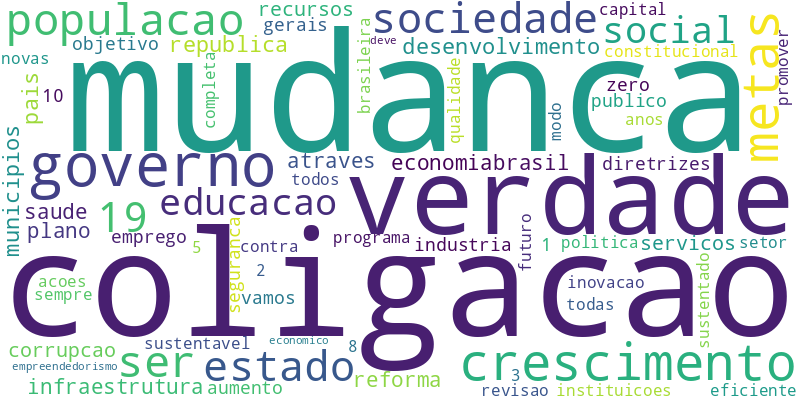

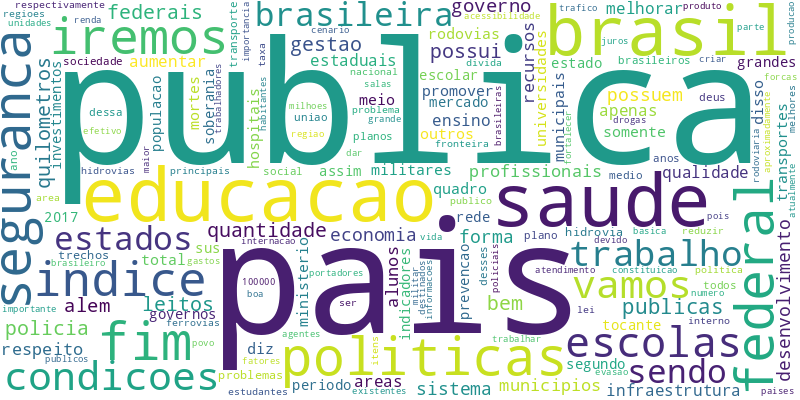

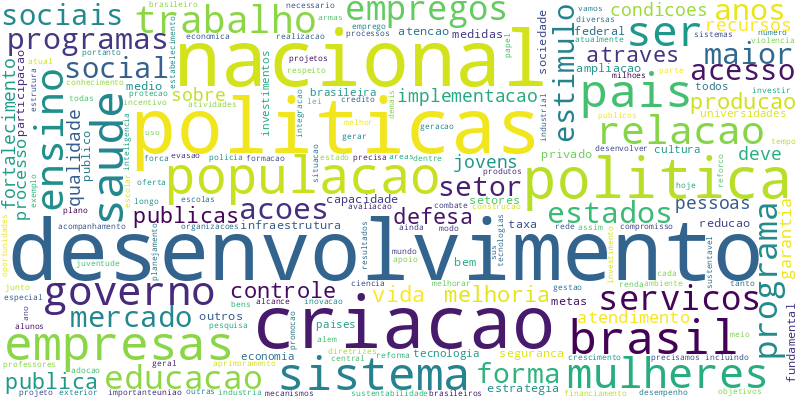

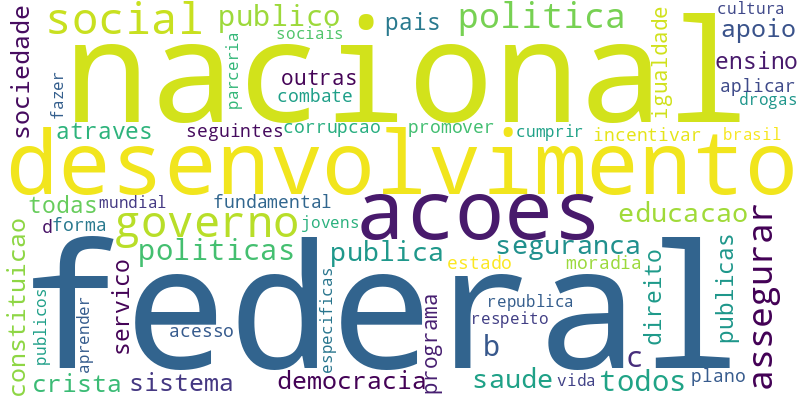

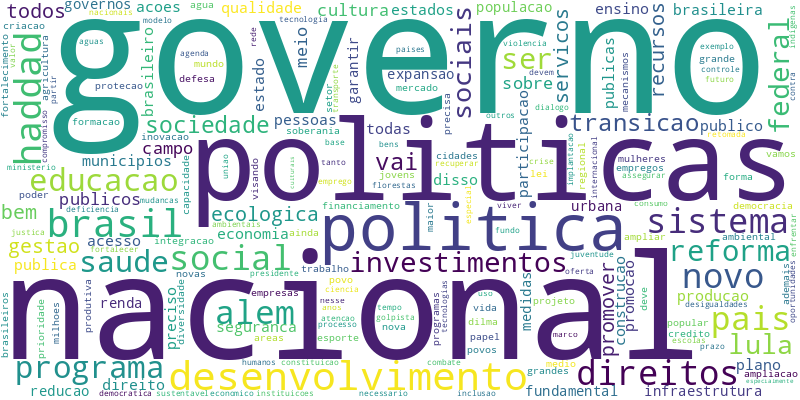

...

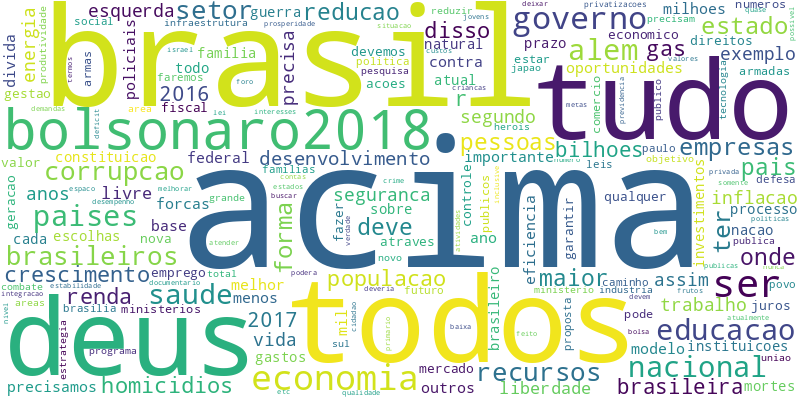

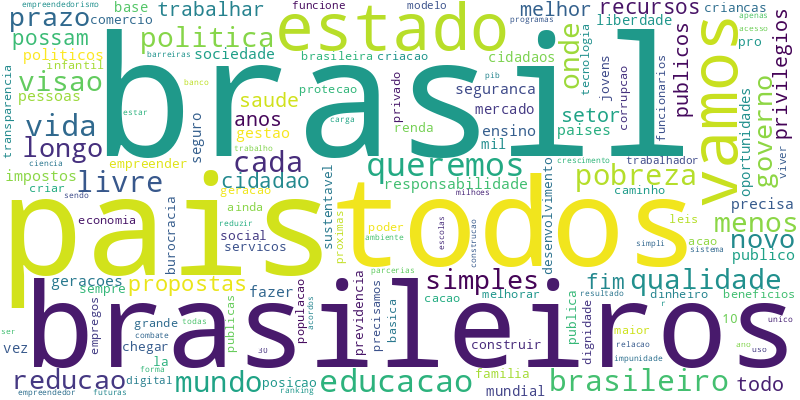

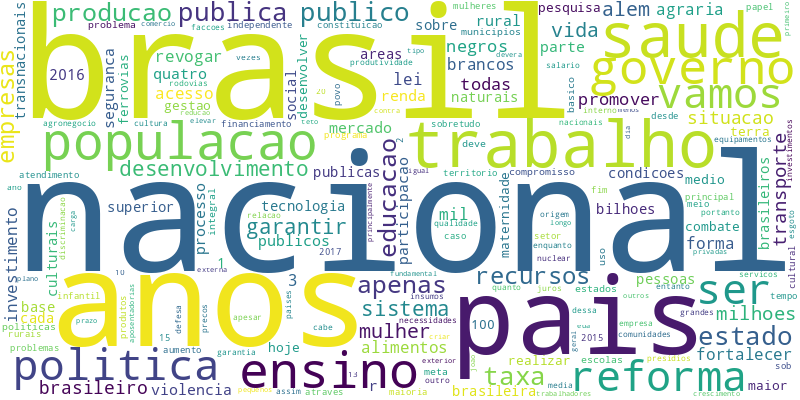

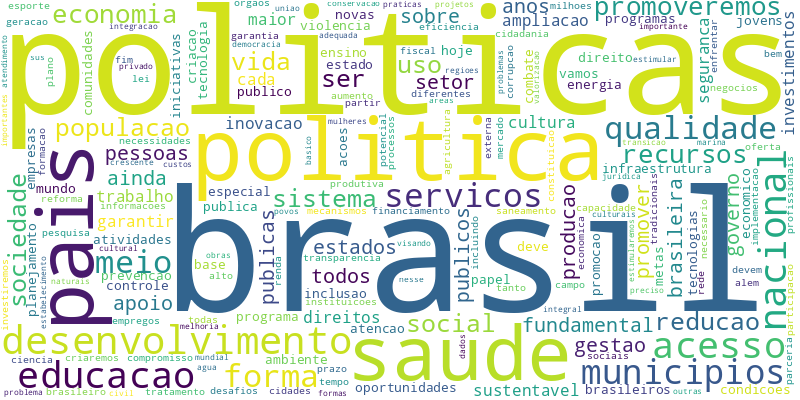

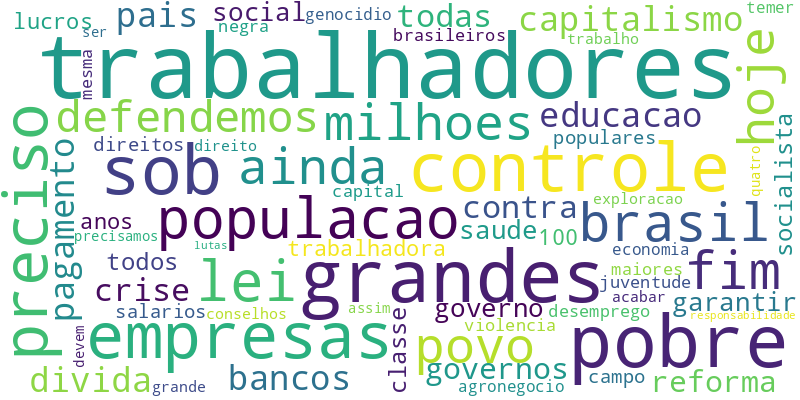

In [35]:
display(HTML("<h3>Nuvens de palavras mais frequentes</h3>"))
for key, value in df["palavras_frequentes"].iteritems():
    display(HTML(f"<h4>{key}</h4>"))
    display(df.loc[key, "wordcloud_palavras_frequentes"])
    display(HTML("<hr/>"))

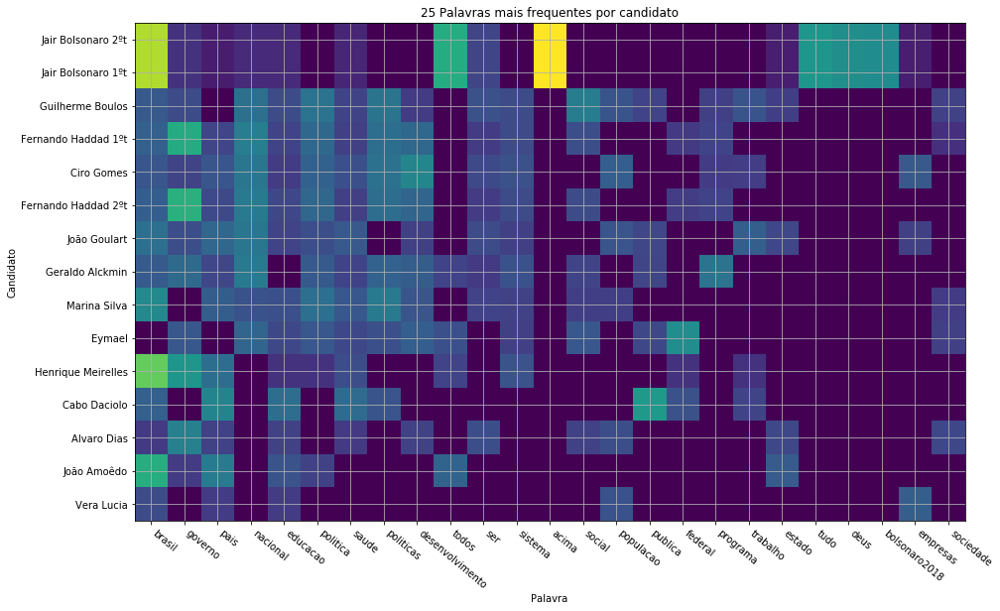

In [38]:
def heatmap(df, title, xlabel, ylabel):
    fig, ax1 = plt.subplots(figsize=(15, 15))
    cax = ax1.imshow(df, interpolation="nearest")
    ax1.grid(True)
    plt.title(title)
    ax1.tick_params("x", labelrotation=-40)
    ax1.set_xticks(np.arange(len(df.columns)))
    ax1.set_yticks(np.arange(len(df.index)))
    ax1.set_xticklabels(df.columns, fontsize=10, horizontalalignment="left")
    ax1.set_yticklabels(df.index,fontsize=10)
    ax1.set_xlabel(xlabel)
    ax1.set_ylabel(ylabel)
    plt.show()


def normalizar_score(row, limite=20):
    sr = pd.Series(dict(row)).sort_values(ascending=False)[:limite]
    return sr/sr.sum()


TOP_PALAVRAS = 25
df_palavras_frequentes = df["palavras_frequentes"].apply(normalizar_score, args=(TOP_PALAVRAS,)).fillna(0)
top_palavras_frequentes = df_palavras_frequentes.sum().sort_values(ascending=False)[:TOP_PALAVRAS].index
top_palavras_frequentes_index = df_palavras_frequentes[top_palavras_frequentes].sum(axis=1).sort_values(ascending=False).index
heatmap(
    df_palavras_frequentes[top_palavras_frequentes].reindex(top_palavras_frequentes_index), 
    f"{TOP_PALAVRAS} Palavras mais frequentes por candidato",
    "Palavra",
    "Candidato")

In [37]:
df_palavras_frequentes

,mudanca,coligacao,verdade,governo,metas,crescimento,ser,populacao,sociedade,19,estado,desenvolvimento,educacao,social,republica,pais,municipios,infraestrutura,economia,reforma,brasil,saude,atraves,plano,corrupcao,publica,politicas,seguranca,federal,fim,iremos,escolas,indice,trabalho,condicoes,vamos,publicas,sendo,brasileira,estados,quantidade,bem,possui,gestao,policia,quilometros,nacional,criacao,politica,empresas,sistema,mulheres,ensino,relacao,empregos,servicos,programa,programas,acoes,maior,anos,assegurar,todos,publico,b,c,apoio,democracia,constituicao,crista,haddad,direitos,novo,alem,investimentos,lula,sociais,transicao,vai,setor,meio,garantir,diretrizes,promover,apoiar,pessoas,lei,sobre,direito,acesso,15,meirelles,pib,investimento,integrado,qualidade,2017,confianca,obras,brasileiros,publicos,acima,tudo,deus,bolsonaro2018,paises,recursos,ter,forma,deve,reducao,queremos,brasileiro,vida,mundo,livre,cada,pobreza,visao,menos,onde,longo,prazo,simples,taxa,apenas,producao,promoveremos,uso,fundamental,trabalhadores,pobre,grandes,sob,controle,preciso,hoje,milhoes,ainda,defendemos,povo,capitalismo,pagamento,divida,bancos,todas
candidato,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Alvaro Dias,0.079365,0.075397,0.075397,0.071429,0.051587,0.051587,0.039683,0.039683,0.035714,0.035714,0.035714,0.031746,0.031746,0.031746,0.031746,0.031746,0.031746,0.027778,0.027778,0.027778,0.027778,0.027778,0.027778,0.027778,0.023810,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Cabo Daciolo,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.059666,0.000000,0.000000,0.073986,0.000000,0.000000,0.000000,0.000000,0.050119,0.057279,0.000000,0.000000,0.000000,0.088305,0.042959,0.040573,0.040573,0.040573,0.038186,0.0358,0.0358,0.033413,0.033413,0.033413,0.031026,0.031026,0.031026,0.031026,0.02864,0.028640,0.02864,0.02864,0.02864,0.02864,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Ciro Gomes,0.000000,0.000000,0.000000,0.033759,0.000000,0.000000,0.036496,0.04

In [39]:
df["bigramas_frequentes"] = df["lista_de_palavras_stopwords"]\
    .apply(lambda row: [item for item in nltk.FreqDist(nltk.bigrams(row)).items() if item[1] >= 4])\
    .apply(lambda row: list(map(lambda x: (" ".join(x[0]), x[1]), row)))

In [40]:
df["wordcloud_bigramas_frequentes"] = ""
display(HTML("<h3>Bigramas mais frequentes</h3>"))
for key, value in df["bigramas_frequentes"].iteritems():
    display(HTML(f"<h4>{key}</h4>"))
    df_candidato = pd.DataFrame(value, columns=["Bigrama", "Quantidade"]).sort_values("Quantidade", ascending=False)
    df_candidato["%"] = 2*df_candidato["Quantidade"]/df.loc[key, "palavras"]  # Normalizada pela quantidade de palavras do plano
        
    frequencias = df_candidato[["Bigrama", "%"]].set_index("Bigrama")["%"].to_dict()
    df.loc[key, "wordcloud_bigramas_frequentes"] = wordcloud.WordCloud(
        width=800, height=400, background_color='white', random_state=50)\
        .generate_from_frequencies(frequencias).to_image()
    display(df_candidato.head(20))

,Bigrama,Quantidade,%
0,coligacao mudanca,19,0.015690
1,mudanca verdade,19,0.015690
4,19 metas,8,0.006606
3,plano 19,5,0.004129
2,diretrizes gerais,4,0.003303


,Bigrama,Quantidade,%
5,seguranca publica,14,0.005821
2,alem disso,7,0.002911
3,politicas publicas,7,0.002911
8,estados municipios,7,0.002911
13,diz respeito,7,0.002911
18,federal policia,6,0.002495
16,saude publica,6,0.002495
12,condicoes trabalho,6,0.002495
0,sendo assim,5,0.002079
4,infraestrutura transportes,5,0.002079


,Bigrama,Quantidade,%
4,mercado trabalho,14,0.001600
44,politicas publicas,13,0.001486
33,ensino medio,13,0.001486
1,nacional desenvolvimento,12,0.001372
84,politica exterior,12,0.001372
36,seguranca publica,10,0.001143
54,deve ser,10,0.001143
28,ensino fundamental,9,0.001029
53,ciencia tecnologia,9,0.001029
48,governo federal,9,0.001029


,Bigrama,Quantidade,%
0,democracia crista,7,0.007600
6,servico publico,6,0.006515
7,publico federal,6,0.006515
2,governo federal,5,0.005429
4,seguranca publica,5,0.005429
1,seguintes acoes,4,0.004343
3,acoes governo,4,0.004343
5,ensino fundamental,4,0.004343
8,politicas publicas,4,0.004343


,Bigrama,Quantidade,%
104,governo haddad,87,0.005573
65,transicao ecologica,46,0.002947
139,governo federal,41,0.002627
112,alem disso,33,0.002114
114,lula dilma,28,0.001794
113,governos lula,27,0.001730
105,haddad vai,26,0.001666
109,politicas publicas,24,0.001537
126,sistema nacional,23,0.001473
141,ensino medio,22,0.001409


,Bigrama,Quantidade,%
106,governo haddad,92,0.005782
64,transicao ecologica,47,0.002954
138,governo federal,43,0.002703
114,alem disso,33,0.002074
107,haddad vai,29,0.001823
116,lula dilma,28,0.001760
115,governos lula,27,0.001697
111,politicas publicas,24,0.001508
126,sistema nacional,23,0.001446
131,estados municipios,20,0.001257


,Bigrama,Quantidade,%
0,programa governo,55,0.004830
38,setor publico,28,0.002459
29,politicas publicas,25,0.002195
71,estados municipios,20,0.001756
17,seguranca publica,17,0.001493
16,direitos humanos,16,0.001405
12,igualdade oportunidades,16,0.001405
87,politica nacional,15,0.001317
58,longo prazo,13,0.001142
24,servicos publicos,12,0.001054


,Bigrama,Quantidade,%
101,politicas publicas,51,0.00153
329,assistencia social,42,0.00126
184,direitos humanos,37,0.00111
27,seguridade social,31,0.00093
83,deve ser,29,0.00087
35,seguranca publica,28,0.00084
156,sociedade civil,28,0.00084
391,esporte lazer,27,0.00081
172,devem ser,27,0.00081
164,trabalhadores trabalhadoras,26,0.00078


,Bigrama,Quantidade,%
6,governo meirelles,14,0.007427
1,brasil forte,7,0.003714
5,15 brasil,6,0.003183
8,governo federal,6,0.003183
0,henrique meirelles,5,0.002653
2,brasil integrado,5,0.002653
7,meirelles vai,5,0.002653
3,brasil humano,4,0.002122
4,brasil seguro,4,0.002122
9,politica externa,4,0.002122


,Bigrama,Quantidade,%
0,brasil acima,82,0.019360
3,deus acima,82,0.019360
4,acima todos,82,0.019360
1,acima tudo,82,0.019360
2,tudo deus,79,0.018652
5,bolsonaro2018 brasil,79,0.018652
22,todos economia,18,0.004250
17,alem disso,9,0.002125
16,forcas armadas,7,0.001653
12,governo federal,6,0.001417


,Bigrama,Quantidade,%
0,brasil acima,82,0.019360
3,deus acima,82,0.019360
4,acima todos,82,0.019360
1,acima tudo,82,0.019360
2,tudo deus,79,0.018652
5,bolsonaro2018 brasil,79,0.018652
22,todos economia,18,0.004250
17,alem disso,9,0.002125
16,forcas armadas,7,0.001653
12,governo federal,6,0.001417


,Bigrama,Quantidade,%
18,longo prazo,11,0.004945
4,onde todos,9,0.004046
19,visao queremos,9,0.004046
3,livre onde,7,0.003147
9,todos brasileiros,7,0.003147
11,cada vez,6,0.002697
2,simples livre,6,0.002697
7,chegar la,6,0.002697
12,protecao social,5,0.002248
20,setor privado,5,0.002248


,Bigrama,Quantidade,%
4,reforma agraria,10,0.002658
0,quatro anos,7,0.001860
12,seguranca publica,7,0.001860
5,recursos naturais,6,0.001595
7,estados municipios,6,0.001595
8,ensino superior,6,0.001595
9,ensino basico,6,0.001595
1,mercado interno,5,0.001329
2,investimento publico,5,0.001329
3,realizar reforma,4,0.001063


,Bigrama,Quantidade,%
20,estados municipios,17,0.002257
18,politicas publicas,16,0.002124
22,novas tecnologias,11,0.001460
4,qualidade vida,10,0.001328
29,mercado trabalho,8,0.001062
13,ciencia tecnologia,8,0.001062
16,politica externa,8,0.001062
45,comunidades tradicionais,8,0.001062
7,saneamento basico,7,0.000929
9,seguranca publica,7,0.000929


,Bigrama,Quantidade,%
5,sob controle,12,0.010954
6,controle trabalhadores,9,0.008215
2,povo pobre,7,0.006390
3,pagamento divida,7,0.006390
0,populacao pobre,4,0.003651
1,classe trabalhadora,4,0.003651
4,conselhos populares,4,0.003651
7,grandes empresas,4,0.003651
8,lei responsabilidade,4,0.003651


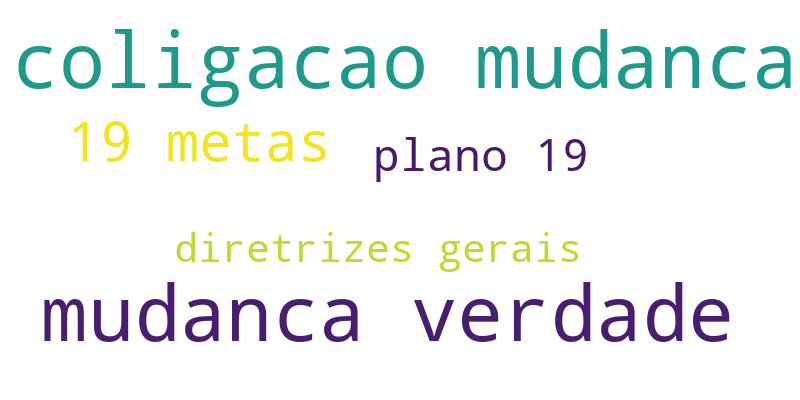

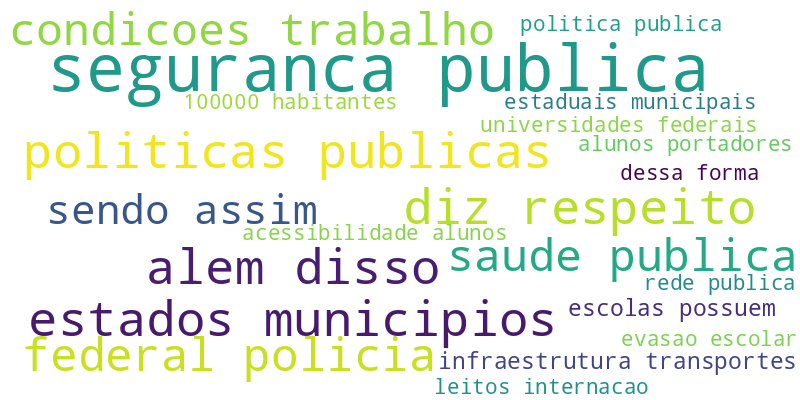

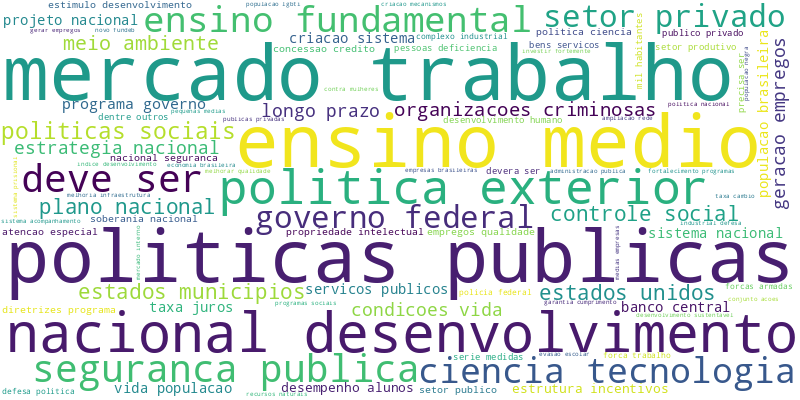

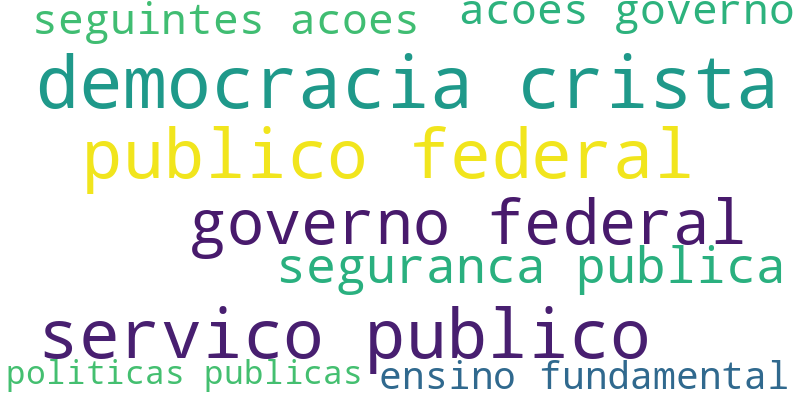

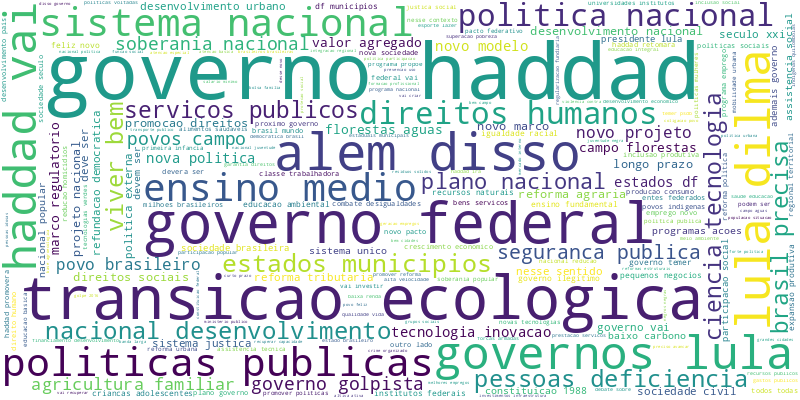

...

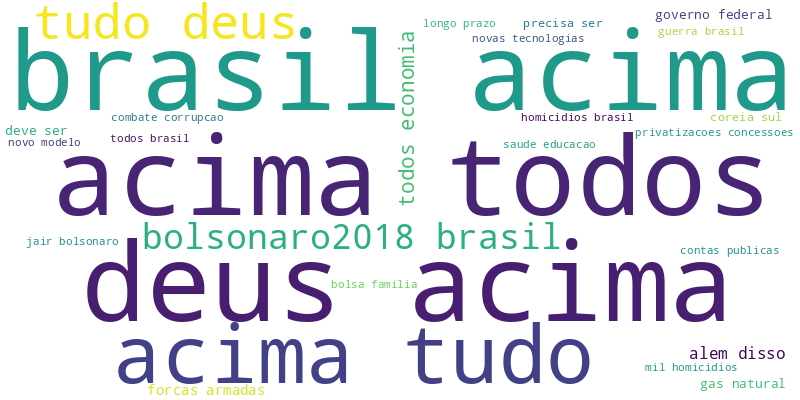

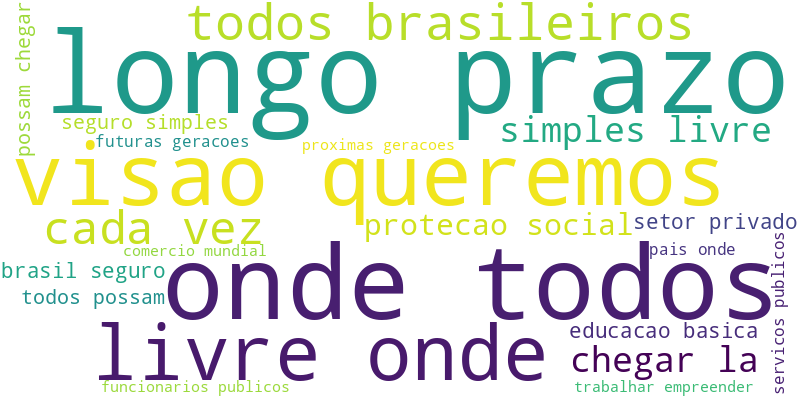

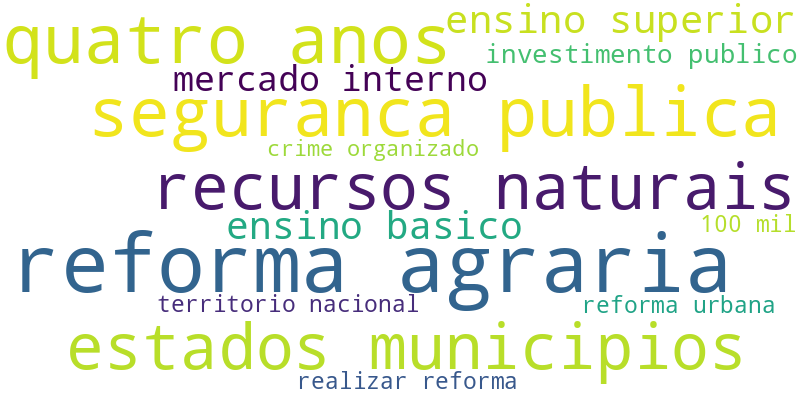

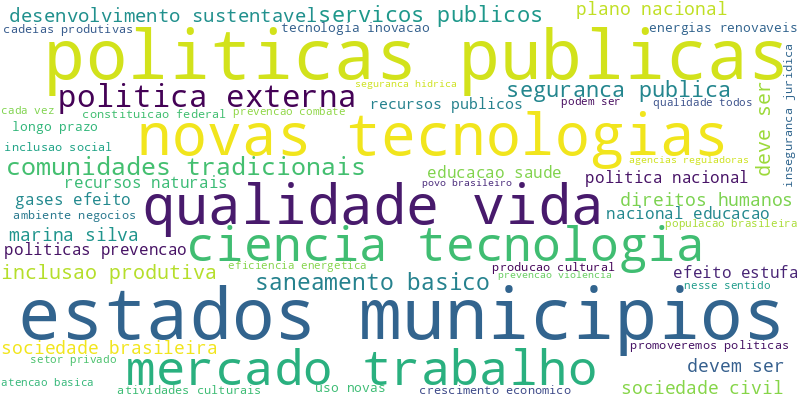

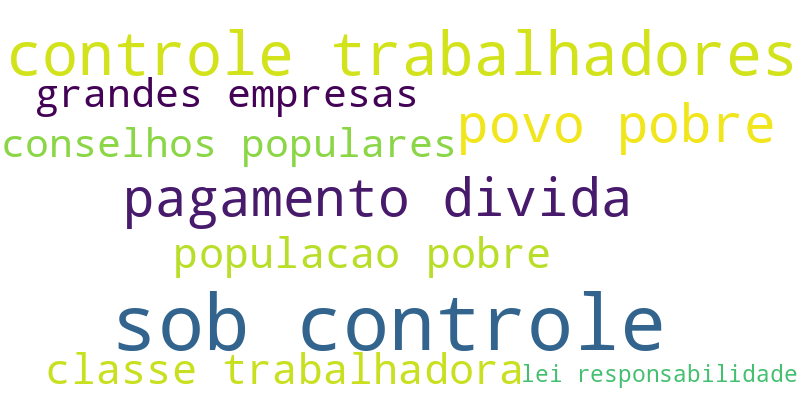

In [41]:
display(HTML("<h3>Nuvens de bigramas mais frequentes</h3>"))
for key, value in df["bigramas_frequentes"].iteritems():
    display(HTML(f"<h4>{key}</h4>"))
    display(df.loc[key, "wordcloud_bigramas_frequentes"])
    display(HTML("<hr/>"))

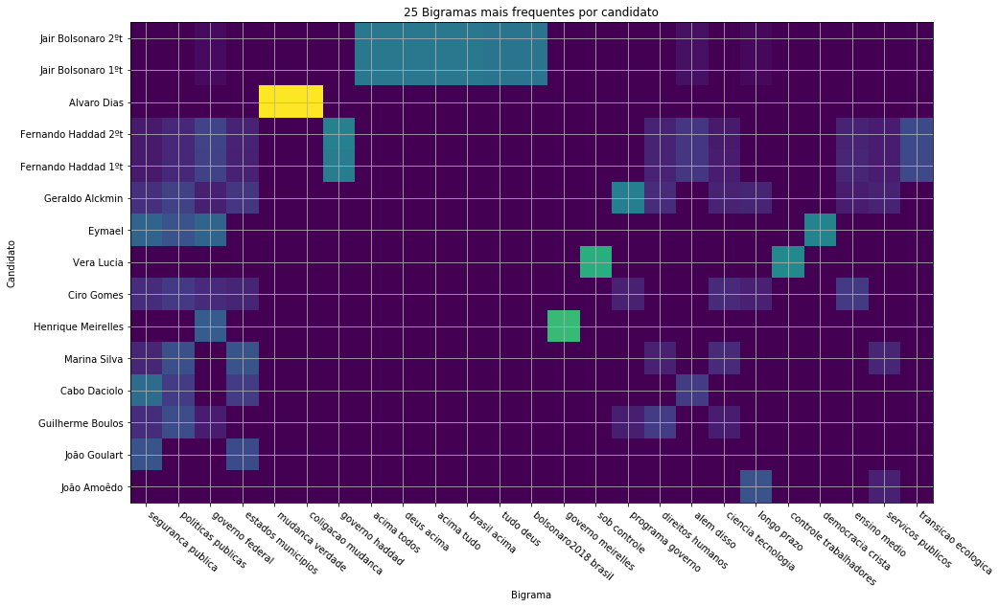

In [42]:
df_bigramas_frequentes = df["bigramas_frequentes"].apply(normalizar_score, args=(TOP_PALAVRAS,)).fillna(0)
top_bigramas_frequentes = df_bigramas_frequentes.sum().sort_values(ascending=False)[:TOP_PALAVRAS].index
top_bigramas_frequentes_index = df_bigramas_frequentes[top_bigramas_frequentes].sum(axis=1).sort_values(ascending=False).index
heatmap(
    df_bigramas_frequentes[top_bigramas_frequentes].reindex(top_bigramas_frequentes_index), 
    f"{TOP_PALAVRAS} Bigramas mais frequentes por candidato",
    "Bigrama",
    "Candidato")

In [43]:
def calcular_pmi(row):
    bigram_measures = nltk.collocations.BigramAssocMeasures()
    finder = nltk.collocations.BigramCollocationFinder.from_words(row)
    finder.apply_freq_filter(4)
    scored = finder.score_ngrams(bigram_measures.pmi)
    return list(map(lambda x: (" ".join(x[0]), x[1]), scored))

df["bigramas_pmi"] = df["lista_de_palavras"].apply(calcular_pmi)

In [44]:
df["wordcloud_bigramas_pmi"] = ""
display(HTML("<h3>Bigramas PMI</h3>"))
for key, value in df["bigramas_pmi"].iteritems():
    display(HTML(f"<h4>{key}</h4>"))
    df_candidato = pd.DataFrame(value, columns=["Bigrama", "Score"])
    
    frequencias = df_candidato[["Bigrama", "Score"]].set_index("Bigrama")["Score"].to_dict()
    df.loc[key, "wordcloud_bigramas_pmi"] = wordcloud.WordCloud(
        width=800, height=400, background_color='white', random_state=50)\
        .generate_from_frequencies(frequencias).to_image()
    display(df_candidato.head(20))

,Bigrama,Score
0,diretrizes gerais,8.598127
1,todas as,7.434628
2,19 metas,7.371618
3,coligacao mudanca,6.920055
4,os municipios,6.241983
5,da republica,5.469394
6,o brasil,5.088853
7,atraves da,5.077076
8,do estado,4.750130
9,um governo,4.679741


,Bigrama,Score
0,100000 habitantes,10.231821
1,evasao escolar,9.646859
2,alunos portadores,9.061896
3,diz respeito,9.061896
4,alem disso,8.772390
5,dessa forma,8.587965
6,sendo assim,8.268347
7,universidades federais,7.839504
8,por 100000,7.587965
9,por meio,7.587965


,Bigrama,Score
0,forcas armadas,12.094902
1,propriedade intelectual,11.509940
2,novo fundeb,11.094902
3,mil habitantes,10.609476
4,banco central,10.357937
5,organizacoes criminosas,10.287547
6,complexo industrial,10.188012
7,longo prazo,9.825442
8,investir fortemente,9.809500
9,recursos naturais,9.571340


,Bigrama,Score
0,democracia crista,8.039702
1,ensino fundamental,7.940167
2,servico publico,7.677132
3,entre outras,7.387626
4,seguranca publica,7.168985
5,politicas publicas,7.092170
6,seguintes acoes,7.065698
7,todas as,6.677132
8,publico federal,6.092170
9,governo federal,5.677132


,Bigrama,Score
0,america latina,12.608255
1,regularizacao fundiaria,12.345220
2,salario minimo,12.345220
3,banda larga,12.122828
4,primeira infancia,11.859794
5,seculo xxi,11.760258
6,entes federados,11.760258
7,classe trabalhadora,11.707790
8,crime organizado,11.608255
9,forcas armadas,11.608255


,Bigrama,Score
0,pt pcdob,12.957737
1,america latina,12.635809
2,regularizacao fundiaria,12.372774
3,banda larga,11.957737
4,salario minimo,11.957737
5,primeira infancia,11.887348
6,forcas armadas,11.787812
7,seculo xxi,11.787812
8,entes federados,11.787812
9,classe trabalhadora,11.735344


,Bigrama,Score
0,preco acessivel,12.153235
1,cadeias produtivas,11.890201
2,forcas armadas,11.667809
3,seculo xxi,11.667809
4,alto rendimento,11.667809
5,marcos regulatorios,11.627167
6,crime organizado,11.475163
7,residuos solidos,11.475163
8,mudancas climaticas,11.305238
9,agencias reguladoras,11.153235


,Bigrama,Score
0,energias renovaveis,14.024599
1,jean wyllys,13.702671
2,nacoes unidas,13.702671
3,wyllys psolrj,13.702671
4,aterros sanitarios,13.702671
5,combustiveis fosseis,13.024599
6,verbas publicitarias,12.854674
7,banda larga,12.702671
8,dotacao orcamentaria,12.702671
9,seculo xxi,12.565167


,Bigrama,Score
0,politica externa,8.880349
1,henrique meirelles,7.488031
2,meirelles vai,7.488031
3,todas as,7.236493
4,governo federal,6.607330
5,governo meirelles,6.437405
6,mais seguro,6.207923
7,mais forte,6.207923
8,mais integrado,6.037998
9,uma politica,6.022368


,Bigrama,Score
0,jair bolsonaro,11.048317
1,contas publicas,10.404460
2,novas tecnologias,10.404460
3,longo prazo,10.048317
4,forcas armadas,9.878392
5,bolsa familia,9.726388
6,novo modelo,9.293429
7,gas natural,9.048317
8,suas familias,8.615357
9,alem disso,8.311351


,Bigrama,Score
0,jair bolsonaro,11.048317
1,contas publicas,10.404460
2,novas tecnologias,10.404460
3,longo prazo,10.048317
4,forcas armadas,9.878392
5,bolsa familia,9.726388
6,novo modelo,9.293429
7,gas natural,9.048317
8,suas familias,8.615357
9,alem disso,8.311351


,Bigrama,Score
0,chegar la,9.534303
1,protecao social,9.534303
2,futuras geracoes,9.119265
3,proximas geracoes,9.119265
4,setor privado,8.949340
5,comercio mundial,8.726948
6,longo prazo,8.659834
7,funcionarios publicos,8.627412
8,possam chegar,8.534303
9,servicos publicos,8.364378


,Bigrama,Score
0,crime organizado,10.877476
1,mercado interno,9.707551
2,nosso compromisso,9.222124
3,100 mil,8.748193
4,reforma urbana,8.707551
5,reforma agraria,8.707551
6,recursos naturais,8.555548
7,seguranca publica,8.427443
8,ensino basico,8.333155
9,nas comunidades,8.233620


,Bigrama,Score
0,agencias reguladoras,11.878913
1,efeito estufa,11.556985
2,cadeias produtivas,11.235057
3,marina silva,10.878913
4,energias renovaveis,10.808524
5,povo brasileiro,10.419481
6,constituicao federal,10.387060
7,inseguranca juridica,10.387060
8,longo prazo,10.293951
9,saneamento basico,10.226836


,Bigrama,Score
0,conselhos populares,8.775446
1,classe trabalhadora,8.453518
2,povo pobre,6.997838
3,acabar com,6.775446
4,todas as,6.396934
5,controle dos,5.718862
6,da divida,5.637942
7,pagamento da,5.637942
8,grandes empresas,5.605521
9,dos trabalhadores,5.512411


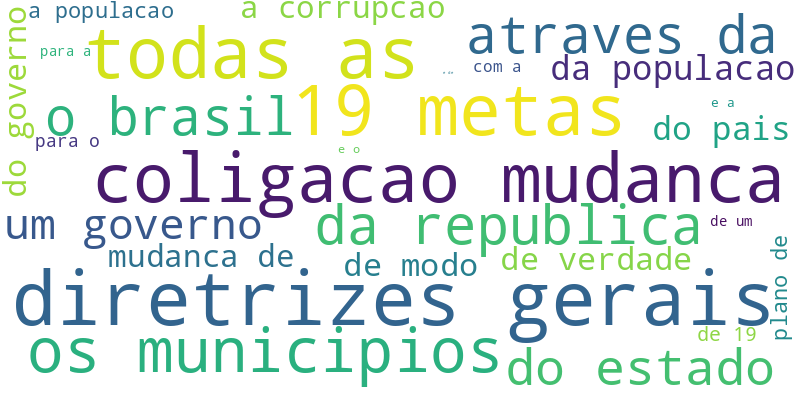

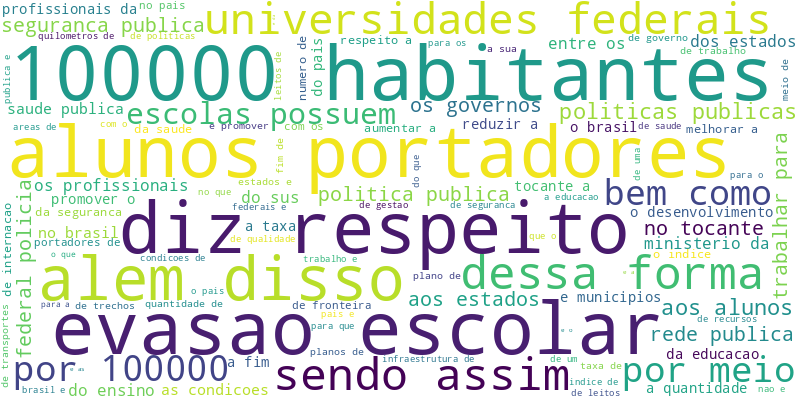

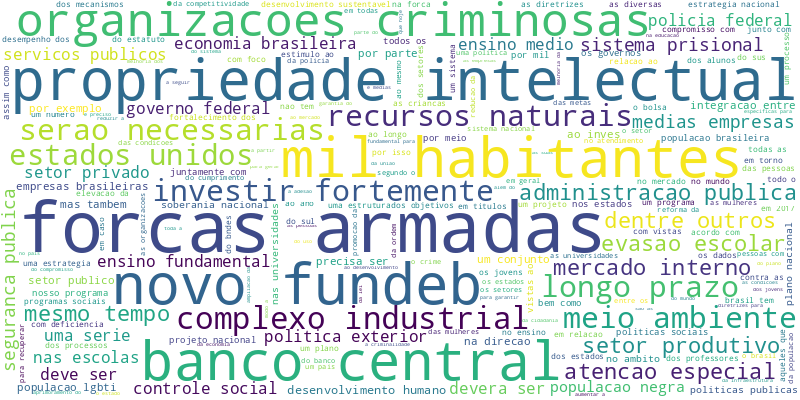

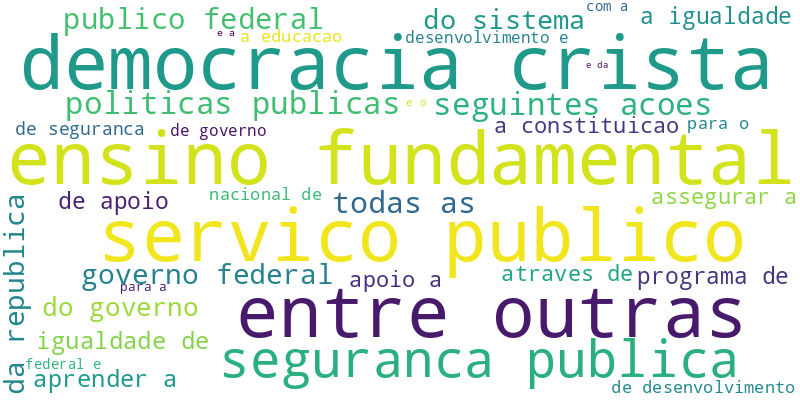

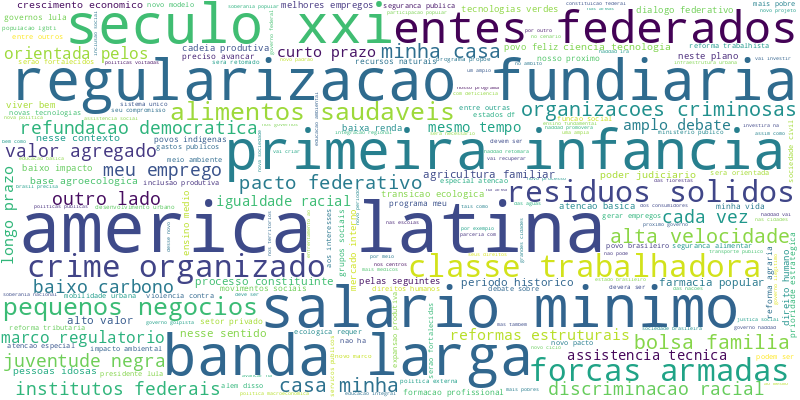

...

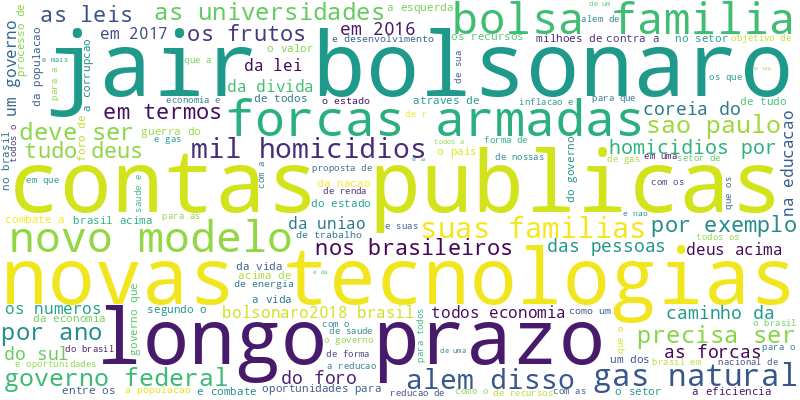

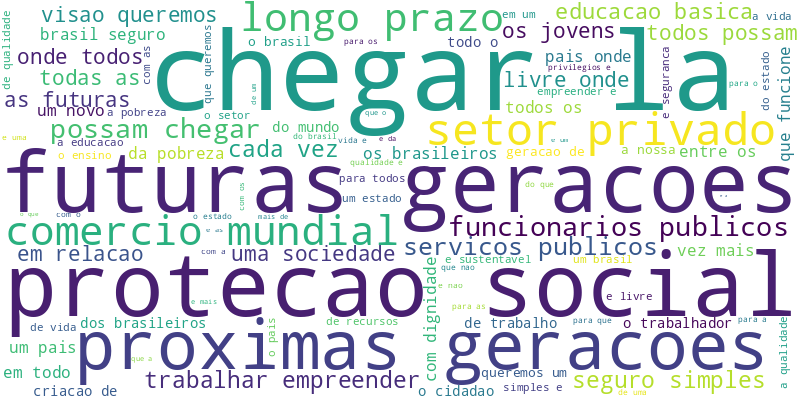

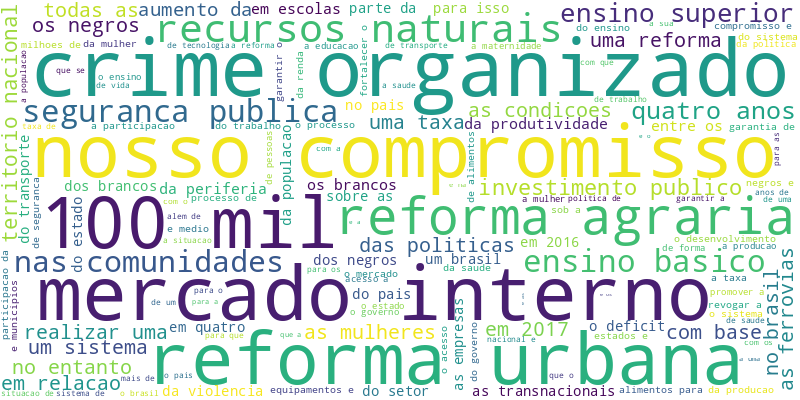

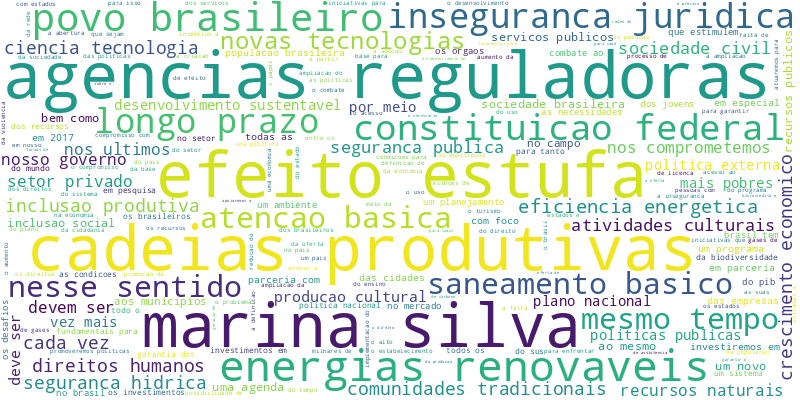

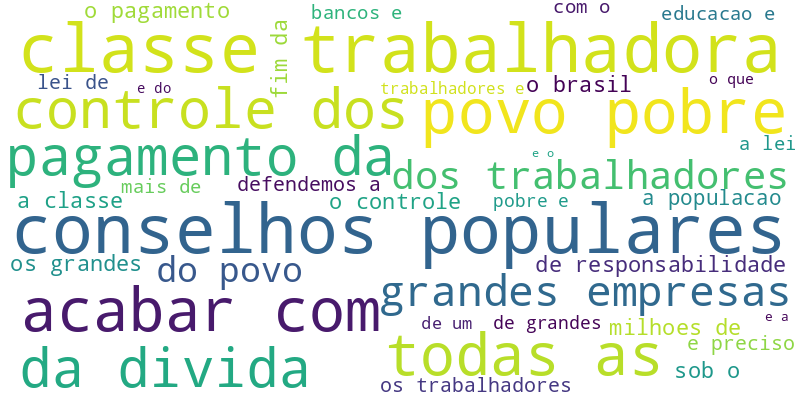

In [45]:
display(HTML("<h3>Nuvens de bigramas PMI</h3>"))
for key, value in df["bigramas_frequentes"].iteritems():
    display(HTML(f"<h4>{key}</h4>"))
    display(df.loc[key, "wordcloud_bigramas_pmi"])
    display(HTML("<hr/>"))

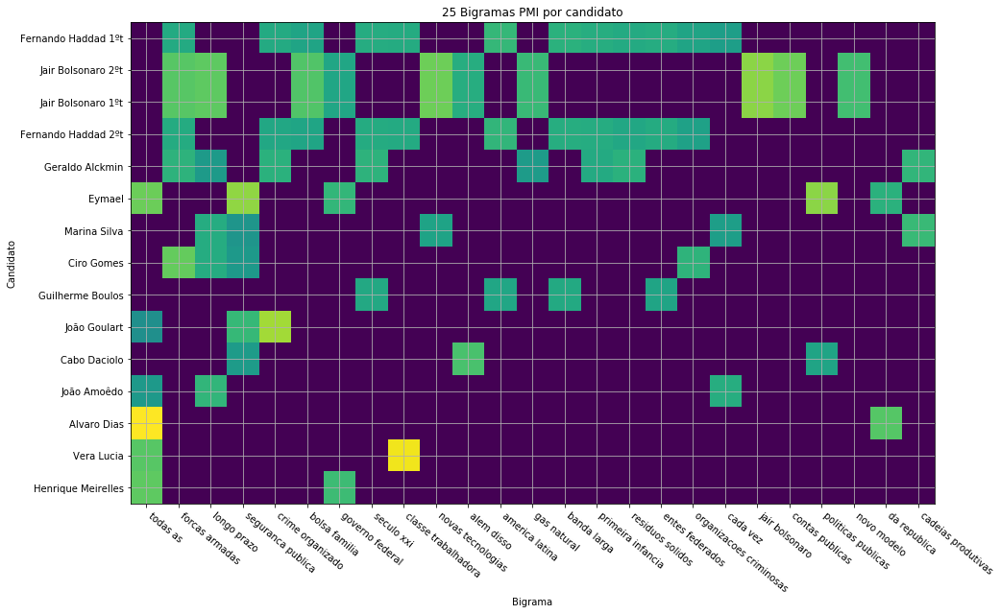

In [46]:
df_bigramas_pmi = df["bigramas_pmi"].apply(normalizar_score, args=(TOP_PALAVRAS,)).fillna(0)
top_bigramas_pmi = df_bigramas_pmi.sum().sort_values(ascending=False)[:TOP_PALAVRAS].index
top_bigramas_pmi_index = df_bigramas_pmi[top_bigramas_pmi].sum(axis=1).sort_values(ascending=False).index
heatmap(
    df_bigramas_pmi[top_bigramas_pmi].reindex(top_bigramas_pmi_index), 
    f"{TOP_PALAVRAS} Bigramas PMI por candidato",
    "Bigrama",
    "Candidato")

In [47]:
vetorizador_tfidf = feature_extraction.text.TfidfVectorizer(
    stop_words=STOPWORDS, ngram_range=(1, 3), max_features=df["palavras_unicas"].sum()//len(df))
features = vetorizador_tfidf.fit_transform(df["texto"])
feature_names = vetorizador_tfidf.get_feature_names()
corpus_index = df.index
df_tfidf = pd.DataFrame(features.T.todense(), index=feature_names, columns=corpus_index)

In [48]:
df["termos_tfidf"] = ""
for key in corpus_index:
    df.loc[key, "termos_tfidf"] = df_tfidf[[key]].apply(lambda row: list(item for item in zip(row.index, row.values) if item[1] > 0)).values

In [49]:
df["wordcloud_tfidf"] = ""
display(HTML("<h3>Palavras relevantes TF-IDF</h3>"))
for key, value in df["termos_tfidf"].iteritems():
    df_candidato = pd.DataFrame(value, columns=["Palavra", "Score"])
    frequencias = df_candidato[["Palavra", "Score"]].set_index("Palavra")["Score"].to_dict()
    df.loc[key, "wordcloud_tfidf"] = wordcloud.WordCloud(
        width=800, height=400, background_color='white', random_state=50)\
        .generate_from_frequencies(frequencias).to_image()
    display(HTML(f"<h4>{key}</h4>"))
    display(df_candidato.sort_values("Score", ascending=False).head(20).reset_index(drop=True))

,Palavra,Score
0,coligacao mudanca verdade,0.432538
1,mudanca verdade,0.432538
2,coligacao mudanca,0.432538
3,coligacao,0.221276
4,verdade,0.206477
5,mudanca,0.190387
6,governo,0.133067
7,metas,0.108937
8,crescimento,0.102307
9,republica,0.081301


,Palavra,Score
0,publica,0.243038
1,pais,0.203627
2,quilometros,0.170506
3,educacao,0.164215
4,saude,0.157646
5,leitos,0.156135
6,iremos,0.144477
7,brasil,0.137941
8,politicas,0.134023
9,possuem,0.130113


,Palavra,Score
0,desenvolvimento,0.208055
1,politicas,0.181013
2,nacional,0.180145
3,criacao,0.152235
4,politica,0.133472
5,populacao,0.128705
6,mulheres,0.119695
7,empresas,0.119171
8,brasil,0.114405
9,pais,0.114405


,Palavra,Score
0,federal,0.233127
1,assegurar,0.178043
2,publico federal,0.168096
3,nacional,0.165448
4,acoes,0.151661
5,desenvolvimento,0.151661
6,politica,0.142466
7,politicas,0.132128
8,servico publico,0.131572
9,social,0.129515


,Palavra,Score
0,haddad,0.303231
1,governo haddad,0.258638
2,governo,0.240143
3,nacional,0.177529
4,politicas,0.160049
5,desenvolvimento,0.138472
6,politica,0.132301
7,transicao ecologica,0.122039
8,brasil,0.121183
9,lula,0.121123


,Palavra,Score
0,haddad,0.320497
1,governo haddad,0.268052
2,governo,0.245164
3,nacional,0.171671
4,politicas,0.156860
5,desenvolvimento,0.133393
6,politica,0.127485
7,transicao ecologica,0.122207
8,brasil,0.116589
9,ecologica,0.115493


,Palavra,Score
0,nacional,0.196737
1,programa,0.182164
2,politicas,0.160995
3,governo,0.155720
4,diretrizes,0.145898
5,desenvolvimento,0.142088
6,programa governo,0.138351
7,garantir,0.134324
8,apoiar,0.128289
9,politica,0.126629


,Palavra,Score
0,politicas,0.183589
1,social,0.177214
2,nacional,0.165456
3,politica,0.161236
4,direitos,0.138309
5,brasil,0.118385
6,trabalho,0.117520
7,populacao,0.108943
8,ser,0.105311
9,lei,0.103603


,Palavra,Score
0,meirelles,0.422744
1,governo meirelles,0.324564
2,brasil,0.316191
3,governo,0.218323
4,15,0.195738
5,pais,0.150567
6,infraestrutura,0.136538
7,anos,0.128228
8,integrado,0.106739
9,sistema,0.105397


,Palavra,Score
0,acima,0.289889
1,deus acima,0.260482
2,brasil acima,0.260482
3,brasil acima tudo,0.260482
4,acima todos,0.260482
5,deus acima todos,0.260482
6,bolsonaro2018,0.257305
7,bolsonaro2018 brasil,0.250952
8,acima tudo deus,0.250952
9,tudo deus acima,0.250952


,Palavra,Score
0,acima,0.289889
1,deus acima,0.260482
2,brasil acima,0.260482
3,brasil acima tudo,0.260482
4,acima todos,0.260482
5,deus acima todos,0.260482
6,bolsonaro2018,0.257305
7,bolsonaro2018 brasil,0.250952
8,acima tudo deus,0.250952
9,tudo deus acima,0.250952


,Palavra,Score
0,brasil,0.282367
1,pais,0.188245
2,queremos,0.180933
3,brasileiros,0.154149
4,pobreza,0.148277
5,simples,0.145480
6,todos,0.144804
7,vamos,0.138734
8,visao,0.136871
9,estado,0.130323


,Palavra,Score
0,nacional,0.178670
1,brasil,0.157010
2,anos,0.149853
3,pais,0.140768
4,trabalho,0.138325
5,mulher,0.119409
6,saude,0.119111
7,taxa,0.118519
8,brancos,0.117116
9,ensino,0.115271


,Palavra,Score
0,promoveremos,0.214188
1,brasil,0.191097
2,politicas,0.187076
3,politica,0.147666
4,pais,0.118712
5,desenvolvimento,0.114044
6,saude,0.110026
7,municipios,0.108307
8,nacional,0.107880
9,servicos,0.098633


,Palavra,Score
0,sob controle,0.341921
1,trabalhadores,0.289889
2,pobre,0.219727
3,grandes,0.181181
4,povo pobre,0.177995
5,sob,0.167289
6,controle,0.157023
7,defendemos,0.155718
8,capitalismo,0.136253
9,preciso,0.132866


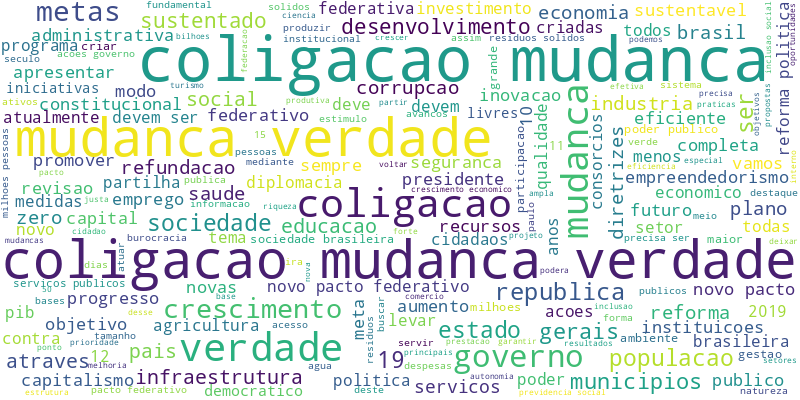

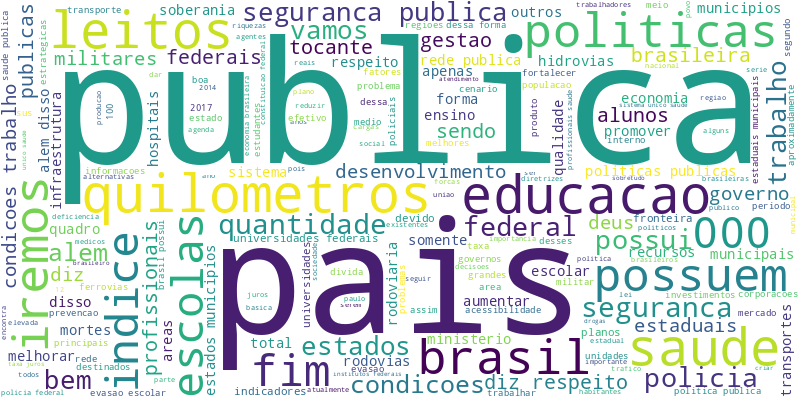

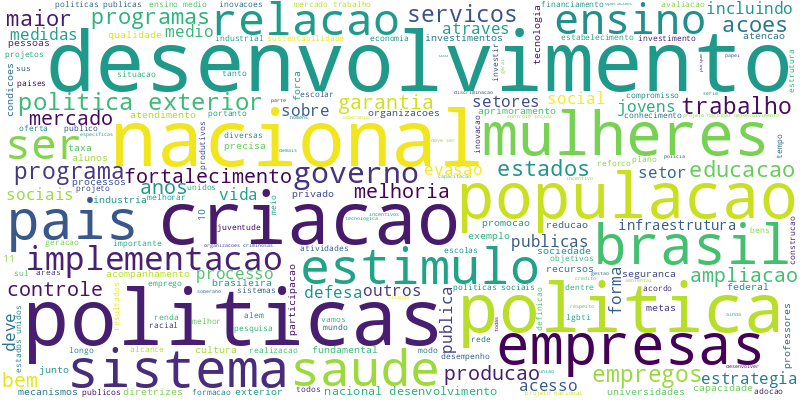

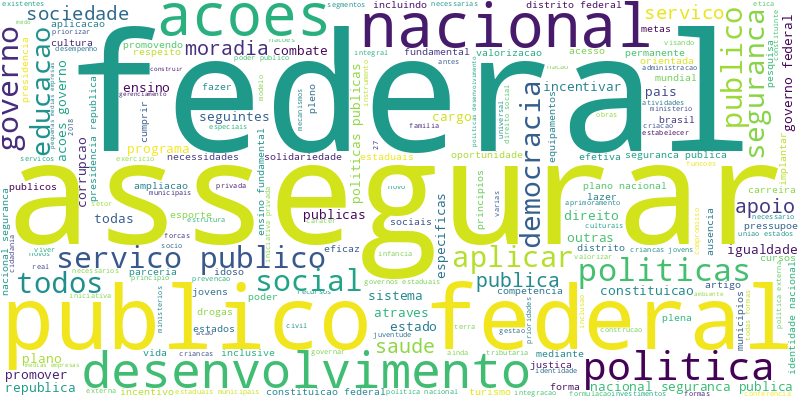

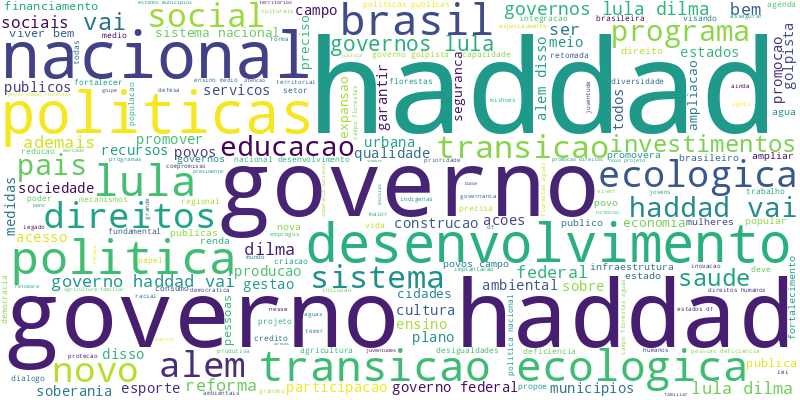

...

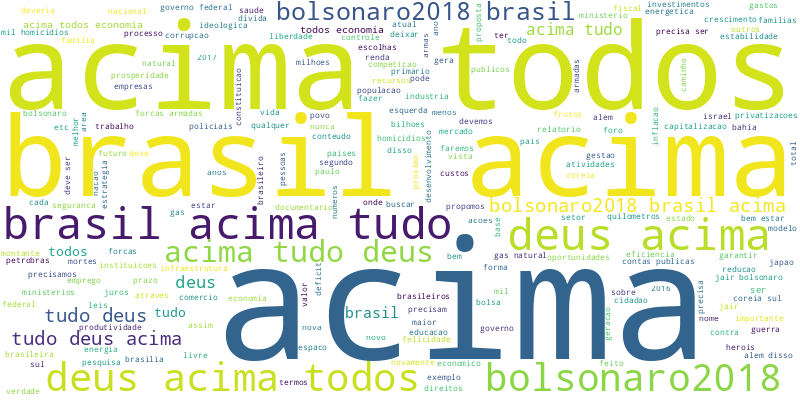

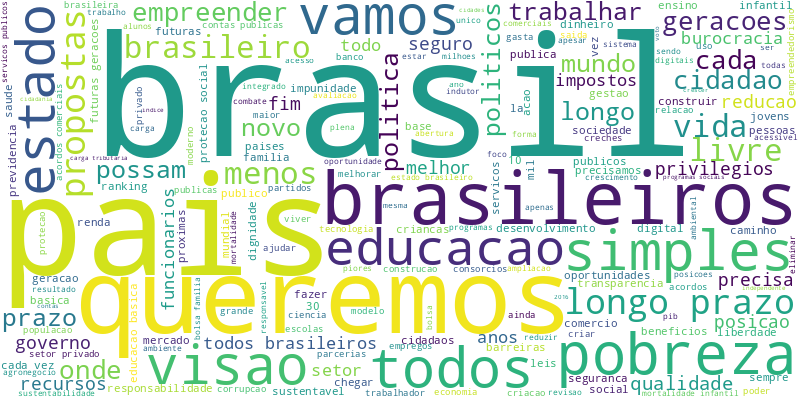

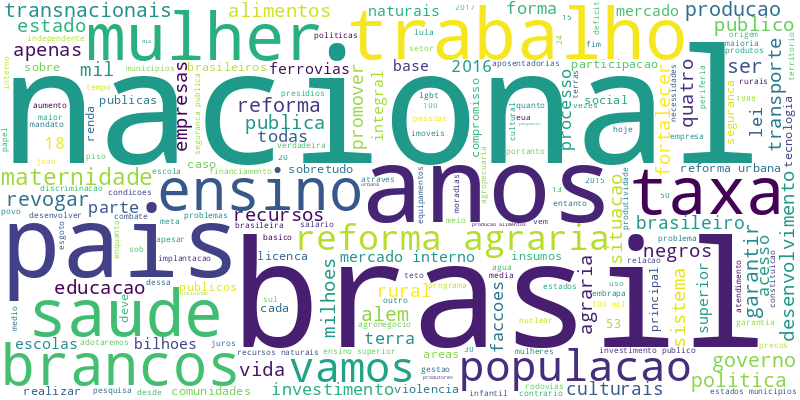

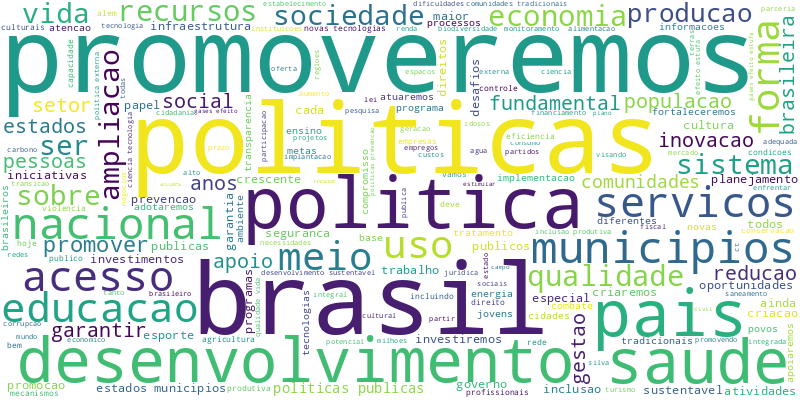

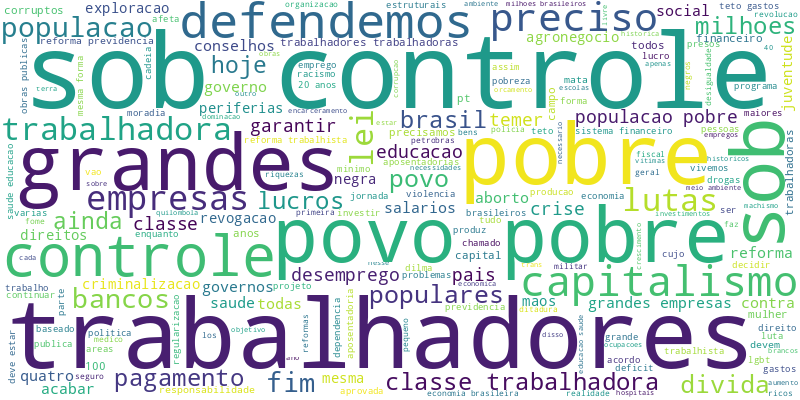

In [50]:
display(HTML("<h3>Nuvens de termos TF-IDF</h3>"))
for key, value in df["termos_tfidf"].iteritems():
    display(HTML(f"<h4>{key}</h4>"))
    display(df.loc[key, "wordcloud_tfidf"])
    display(HTML("<hr/>"))

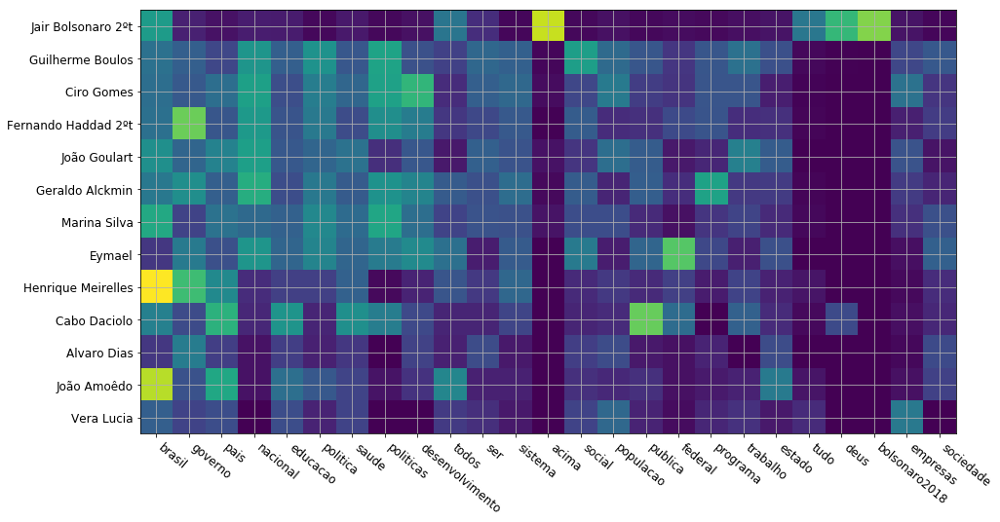

In [51]:
def heatmap(df, title, xlabel, ylabel):
    fig, ax1 = plt.subplots(figsize=(15, 15))
    cax = ax1.imshow(df, interpolation="nearest")
    ax1.grid(True)
    ax1.tick_params("x", labelrotation=-40)
    ax1.set_xticks(np.arange(len(df.columns)))
    ax1.set_yticks(np.arange(len(df.index)))
    ax1.set_xticklabels(df.columns, fontsize=12, horizontalalignment="left")
    ax1.set_yticklabels(df.index,fontsize=12)
    plt.show()
    

top_termos_tfidf = df_tfidf.sum(axis=1).sort_values(ascending=False)[:TOP_PALAVRAS].index
top_termos_tfidf_index = df_tfidf.transpose()[top_palavras_frequentes].sum(axis=1).sort_values(ascending=False).index

heatmap(
    df_tfidf.transpose()[top_palavras_frequentes].reindex(top_palavras_frequentes_index).drop(index=["Fernando Haddad 1ºt", "Jair Bolsonaro 1ºt"]), 
    f"{TOP_PALAVRAS} Termos TF-IDF por candidato",
    "Palavra",
    "Candidato")

In [52]:
modelo_pca = decomposition.PCA(n_components=2)
projecao_pca = modelo_pca.fit_transform(df_tfidf.transpose())

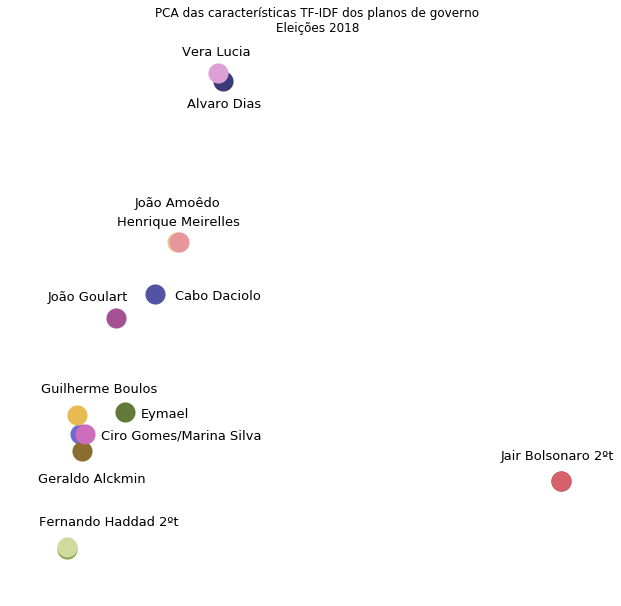

In [59]:
offset = {
    "Vera Lucia": (-0.14, -0.07),
    "Alvaro Dias": (-0.14, -0.15),
    "Jair Bolsonaro 1ºt": (-0.4, 0),
    "Jair Bolsonaro 2ºt": (-0.2, -0.06),
    "Henrique Meirelles": (-0.2, -0.07),
    "João Amoêdo": (-0.16, -0.037),
    "Cabo Daciolo": (0.0, -0.11),
    "João Goulart": (-0.22, -0.07),
    "Eymael": (-0.01, -0.11),
    "Marina Silva": (-0.01, -0.11),
    "Geraldo Alckmin": (-0.16, -0.16),
    "Fernando Haddad 2ºt": (-0.12, -0.06),
    "Guilherme Boulos": (-0.14, -0.06),
}
fig, ax = plt.subplots(figsize=(10, 10))
for idx, (candidato, value) in enumerate(zip(corpus_index, projecao_pca)):
    ax.scatter(value[0], value[1], label=candidato, s=400, linewidth=0.1)
    offset_candidato = np.array((value[0]+0.05, value[1]+0.1))
    offset_candidato += offset.get(candidato, (0, 0))
    if candidato not in ["Jair Bolsonaro 1ºt", "Fernando Haddad 1ºt", "Ciro Gomes"]:
        if candidato == "Marina Silva":
            candidato = "Ciro Gomes/Marina Silva"
        ax.annotate(candidato, offset_candidato,fontsize=13)
ax.set_title("PCA das características TF-IDF dos planos de governo\nEleições 2018")
ax.axis('off')
plt.show()

In [54]:
pd.DataFrame(projecao_pca, columns=("x", "y"), index=corpus_index)

,x,y
candidato,,
Alvaro Dias,0.093865,0.521361
Cabo Daciolo,-0.073722,0.127390
Ciro Gomes,-0.259881,-0.129519
Eymael,-0.148861,-0.089879
Fernando Haddad 1ºt,-0.293758,-0.340675
Fernando Haddad 2ºt,-0.292457,-0.338245
Geraldo Alckmin,-0.255055,-0.160566
Guilherme Boulos,-0.267599,-0.094622
Henrique Meirelles,-0.019743,0.223512


In [55]:
def _substituir_bigramas(row, bigramas):
    b_iter = iter(zip(row, row[1:]))
    for p1, p2 in b_iter:
        bigrama = f"{p1} {p2}"
        if bigrama in bigramas:
            yield bigrama
            try:
                next(b_iter)
            except(StopIteration):
                pass
        else:
            yield p1

            
def substituir_bigramas(row, bigramas):
    return list(_substituir_bigramas(row, bigramas))
    
bigramas = np.unique(np.concatenate(df["bigramas_frequentes"].apply(lambda row: list(map(lambda x: x[0], row))).values))
df["tokens"] = df["lista_de_palavras_stopwords"].apply(substituir_bigramas, args=(bigramas,))

In [60]:
NUM_TOPICS = 4
dictionary = gensim.corpora.Dictionary(df["tokens"])
corpus = [dictionary.doc2bow(text) for text in df["tokens"]]
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics = NUM_TOPICS, id2word=dictionary, passes=15, random_state=42)
lda_display = pyLDAvis.gensim.prepare(ldamodel, corpus, dictionary, sort_topics=False)
pyLDAvis.display(lda_display)